In [1]:
## read json

import pandas,json,os
from google.colab import drive
drive.mount('/content/drive')

rootPath = '/content/drive/MyDrive/UCLA REU 2021 KG /'
def fullPath(filename):
  return os.path.join(os.path.dirname(rootPath), filename) # rootPath+filename

"""
with open(fullPath('results/2020Mar11-2021June16/processed_tweets_20mar11-21june16.json')) as file:
  jsons = json.load(file)
"""
with open('/content/drive/MyDrive/UCLA REU 2021 KG /results/2020Mar11-2021June16/dataframes/tweet_data.json') as file:
  jsons = json.load(file)

print(jsons[0])
with open(('/content/drive/MyDrive/UCLA REU 2021 KG /results/2020Mar11-2021June16/dataframes/user_data.json')) as file:
  user_data = json.load(file)

with open('/content/drive/MyDrive/UCLA REU 2021 KG /results/2020Mar11-2021June16/dataframes/topic_data_with_peaks.json') as file:
  topic_data = json.load(file)

Mounted at /content/drive
{'tweet-id': 1237634687520014336, 'user-id': 1289202337, 'user-screen_name': 'samstahmandy', 'verified': False, 'text': 'Realized my roommate was patient 0 for coronavirus omg I know someone famous 🤩🤩', 'cleaned_text': ['realize', 'roommate', 'patient', 'coronavirus', 'know', 'someone', 'famous'], 'hashtags': {}, 'mentions': {}, 'in-reply-to': None, 'quoted': None, 'timestamp': 'Wed Mar 11 07:01:18 +0000 2020', 'followers-count': 1042, 'replies_count': 0, 'quote_count': 0, 'replies': [], 'quotes': [], 'nmf_keywords': [], 'nmf_sentiment_dict': {}, 'nmf_topics': [0, 1, 7, 10, 15, 21, 53, 76], 'nmf_topic_distribution': [[0, 0.004532880321274729], [1, 0.00020720658069324155], [7, 0.3163437271146775], [10, 0.022516416127119337], [15, 0.01096492762772925], [21, 0.4920142185840658], [53, 0.05293271412643609], [76, 0.05453490097674193]], 'sentiment_score': 0.0, 'keywords': {'0': ['patient', '1.0'], '1': ['wanna', '0.81562865'], '7': ['coronavirus', '1.0'], '10': ['pat

In [2]:
### create triples
from collections import namedtuple
# convert date format

def convert_date(date:str):
  return (date[4:6] +'-'+ date[:3] +  '-' + date[-2:])

Triple = namedtuple("Triple", "subj pred obj")
triples = []
def createTriples(r, s, o): # for each json object x, it adds an edge from x[s] to x[o] with relation r.
  for i in range(0,len(jsons)):
    x = jsons[i]
    if (s in x) and (x[s]):
      if (o in x) and (x[o] != []) and x[o] != {} and x[o] != None:
        if (o == "keywords"):
          triples.append(Triple(subj=x[s],pred=r,obj=(x[o])))
        elif (o=='hashtags' or o == 'mentions'):
          triples.append(Triple(subj=x[s],pred=r,obj=(list(x[o].keys()))))
        elif (o=='timestamp'):
          triples.append(Triple(subj=x[s],pred=r,obj=(convert_date(str(x[o][4:10]+x[o][-4:])))))

        else:
          triples.append(Triple(subj=x[s],pred=r,obj=x[o]))
  for i in range(0,len(user_data)):
    x = user_data[i]
    if (s in x) and (x[s]):
      if (o in x) and (x[o]):
        if (o == "keywords"):
          triples.append(Triple(subj=x[s],pred=r,obj=list(x[o])))
        else:
          triples.append(Triple(subj=x[s],pred=r,obj=x[o]))
  for i in range(0,len(topic_data)):
    x = topic_data[i]
    if (s in x) and (x[s]):
      if (o in x) and (x[o]):
        if (o == "keywords"):
          triples.append(Triple(subj=x[s],pred=r,obj=list(x[o])))
        else:
          triples.append(Triple(subj=x[s],pred=r,obj=x[o]))
createTriples("has_keyword","tweet-id","keywords")

createTriples("mentions","tweet-id","mentions")
createTriples("Topic","tweet-id","nmf_topics")

createTriples("quoted_by","tweet-id","quotes")
 
createTriples("keyword","topic_id","keywords")
createTriples("timestamp","tweet-id","timestamp")
createTriples("tweeted_by","tweet-id","user-id")
createTriples("replied_by","tweet-id","replies")


createTriples("hashtags","tweet-id","hashtags")

 # need to add keyword key and its value in the sample database dictionary
#createTriples("sentimentScore","tweet-id","vadar_sentiment")
#createTriples("sentimentScore","tweet-id","sentiment_score")

#createTriples("screen_name","user-id","user-screen_name")



#add event
import csv, json, os, random
def read_csv(file_dir):

  lst = []
  with open(file_dir, 'r') as f:
    reader = csv.reader(f)
    i=0
    for row in reader:
      fact = []
      for i in range(len(row)):
        if i == 3:
          fact.append(str(row[i]))
        else:
          fact.append(str(row[i]))
      lst.append(fact)
  return lst



#community_louvain

In [3]:
import networkx as nx
import community.community_louvain
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#add triples to graph, construct the graph using data from document_data.json
G = nx.Graph() 
event_data = read_csv('/content/drive/MyDrive/UCLA REU 2021 KG /results/2020Mar11-2021June16/dataframes/event_data.csv')
for (date, event,_) in event_data[1:]:
    G.add_edge(str(event),str(date),relation='announced on')

for triple in triples:
  
    
    if isinstance(triple.obj, list):
      for o in triple.obj:
        G.add_edge(str(triple.subj),str(o),relation=str(triple.pred)) # keep the relation as an edge attribute
    elif isinstance(triple.obj,dict):
      for keyword, w in (triple.obj).values():
        G.add_edge(str(triple.subj),str(keyword),relation=str(triple.pred)) #weight = w) # keep the relation as an edge attribute

    else:
      G.add_edge(str(triple.subj),str(triple.obj),relation=str(triple.pred)) # keep the relation as an edge attribute
  
#coms = algorithms.louvain(G, weight='weight', resolution=1., randomize=False)




In [ ]:

# return partition as a dict
partition = community.community_louvain.best_partition(G)
print(list(partition.items())[:10])

In [ ]:
from collections import defaultdict

partition_dict_by_community = defaultdict(list)
for k,v in partition.items():
  partition_dict_by_community[v].append(k)
with open('/content/drive/MyDrive/UCLA REU 2021 KG /Community Detection/communities_of_expanded_graph1.json','w') as file:
  json.dump(partition,file)

with open('/content/drive/MyDrive/UCLA REU 2021 KG /Community Detection/communities_of_expanded_graph2.json','w') as file:
  json.dump(partition_dict_by_community, file)



"""
Dominic, This is the last cell to run
"""

In [4]:
with open('/content/drive/MyDrive/UCLA REU 2021 KG /Community Detection/communities_of_expanded_graph1.json') as file:
  partition = json.load(file)

with open('/content/drive/MyDrive/UCLA REU 2021 KG /Community Detection/communities_of_expanded_graph2.json') as file:
  partition_dict_by_community = json.load(file)




In [5]:
print('number of nodes: ',len(partition))
print('number of communities: ', len(partition_dict_by_community))

print('size of community 6: ', len(partition_dict_by_community['6']))
print('size of community 7: ', len(partition_dict_by_community['7']))
print('size of community 8: ', len(partition_dict_by_community['8']))
print('size of community 7: ', len(partition_dict_by_community['9']))



number of nodes:  733475
number of communities:  31
size of community 6:  104830
size of community 7:  78631
size of community 8:  69360
size of community 7:  27375


In [ ]:
# visualization
pos = nx.spring_layout(G)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=50,cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.9999)
plt.show()
plt.savefig("community_detection_louvain.png")

In [ ]:
#wordcloud
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
 
def print_keywords(keyword_list:[str]):
  comment_words = ''
  for word in keyword_list:
    comment_words += word 
    comment_words += " "
  stopwords = set(STOPWORDS) 
  wordcloud = WordCloud(width = 500, height = 500,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 5).generate(comment_words)
 
  # plot the WordCloud image                      
  plt.figure(figsize = (8, 8), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)
  
  plt.show()

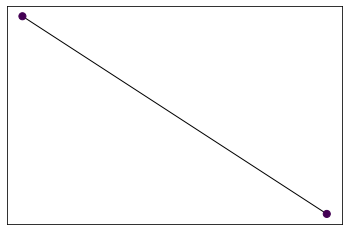

<Figure size 432x288 with 0 Axes>

In [6]:
import networkx as nx
import community.community_louvain
import matplotlib.pyplot as plt
import matplotlib.cm as cm
def plot_communities(community_N: [int], partition: dict,partition_dict_by_community:dict, G: nx.graph):
  """
  plot subgraph of communities_N
  """
  #subgraph g
  g = nx.Graph()
  colors = []
  nodes = []
  for i in community_N:
    
    node = partition_dict_by_community[str(i)]
    colors += [i,]*len(node)
    nodes += node
    for node1 in node:
      for node2 in node:
        if (node1, node2) in G.edges():
          g.add_edge(node1, node2)
  pos = nx.spring_layout(g)
  nx.draw_networkx_nodes(g, pos, nodes, node_size=50, node_color=colors)
  nx.draw_networkx_edges(g, pos, alpha=0.9999)
  plt.show()
  plt.savefig("community_detection_louvain.png")
     
plot_communities([1], partition,partition_dict_by_community, G)

In [7]:

def plot_one_community(community_N: int, partition: dict,partition_dict_by_community:dict, G: nx.graph):
  """
  plot subgraph of community_N
  """
  #subgraph g
  g = nx.Graph()
  edgelabels = {}
  node = partition_dict_by_community[community_N]
  colors = [0 if ((len(integer) == 19)  and integer.isdigit()) else 1 for integer in node]
  for node1 in node:
    for node2 in node:
      #undirected graph
      if ((node1, node2) in G.edges()) and ((node1, node2) not in g.edges() and (node2, node1) not in g.edges()):
        g.add_edge(node1, node2)
        edgelabels[(node1, node2)] = G.edges[node1,node2]['relation']
        #print(node1, node2, edgelabels[(node1, node2)])
  plt.figure(figsize = (40, 40))
  pos = nx.spring_layout(g)
  nx.draw_networkx_nodes(g, pos, node, node_size=100, node_color=colors)
  nx.draw_networkx_edges(g, pos, alpha=0.9999)
  nx.draw_networkx_edge_labels(g, pos, edge_labels=edgelabels, font_size=20)

  plt.show()
  plt.savefig(f"community_detection_louvain_community{community_N}.png")
     
plot_one_community(57, partition,partition_dict_by_community, G)

KeyError: ignored

In [ ]:
for i in jsons:
  if i['tweet-id'] == 1246586501330128896:
    print(i['user-id'])

#14303901

14303901


# analyze basic properties of each community

In [8]:
# how many tweets in each community
from collections import defaultdict
def number_of_tweets(community_N: int, G: nx.graph, partition: dict,partition_dict_by_community: dict):
  return sum([1 if ((len(integer) == 19)  and integer.isdigit()) else 0 for integer in partition_dict_by_community[community_N]])

def number_of_users(community_N: int, G: nx.graph, partition: dict,partition_dict_by_community: dict):
  return sum([0 if ((len(integer) == 19)  and integer.isdigit()) else 1 for integer in partition_dict_by_community[community_N]])

partition_dict_by_community = defaultdict(list)
for node in partition:
  partition_dict_by_community[partition[node]].append(node)                                                                                                                   
print(number_of_tweets(56, G, partition, partition_dict_by_community))
print(number_of_users(56, G, partition, partition_dict_by_community))

# statistics
from collections import defaultdict
print(f"There are {max(partition.values())+1} communities in total.")


0
0
There are 31 communities in total.


In [9]:
#users in total
#time,keyword of tweets

def find_common_keyword(community_N: int, G: nx.graph, partition: dict,partition_dict_by_community: dict):
  """ find common keywords among each community """
  keyword_list = []
  for tweet in jsons:
    if str(tweet['tweet-id']) in partition_dict_by_community[community_N]:
      if (len(str(tweet['tweet-id'])) >= 19 and str(tweet['tweet-id']).isdigit()):
        keyword_list += tweet['cleaned_text']
  return keyword_list

def print_most_common_keywords(keyword_list: [str], N: int):
  """
  print common keywords in the keyword_list, and wordcloud of top N common keywords
  """

  keyword_dict = {}
  for word in keyword_list:
    if word not in keyword_dict:
      keyword_dict[word] = keyword_list.count(word)
  print(f"Common keywords: ", [(x, keyword_dict[x]) for x in sorted(keyword_dict.keys(), key = lambda x: keyword_dict[x], reverse = True)])

  print_keywords([x for x in sorted(keyword_dict.keys(), key = lambda x: keyword_dict[x], reverse = True)][:N])

dict_by_community_sorted = sorted(partition_dict_by_community, key = lambda x: (number_of_users(x, G, partition, partition_dict_by_community), len(partition_dict_by_community[x])), reverse = True)
"""
for i in jsons:
  if str(i['tweet-id']) in partition_dict_by_community[dict_by_community_sorted[2]]:
      print(i['user-id'])
"""

def find_popular_keywords(community_N: int, G: nx.graph, partition: dict,partition_dict_by_community: dict):
  print('common keywords: ')
  keyword_list = []
  for node in partition_dict_by_community[community_N]:
    if not str(node).isdigit() and len(str(node))< 20 and '-' not in str(node):
      keyword_list += [node,]
  keyword_dict = {}
  for word in keyword_list:
    if word not in keyword_dict:
      keyword_dict[word] = keyword_list.count(word)

  return [x for x in sorted(keyword_dict.keys(), key = lambda x: keyword_dict[x], reverse = True)]

def find_popular_topics(community_N: int, G: nx.graph, partition: dict,partition_dict_by_community: dict):
  print('common topics: ')
  topic_list = []
  for node in partition_dict_by_community[community_N]:
    if (str(node).isdigit()) and (len(str(node))<=2):
      topic_list += [node,]
  topic_dict = {}
  for topic in topic_list:
    if topic not in topic_dict:
      topic_dict[topic] = topic_list.count(topic)

  return [x for x in sorted(topic_dict.keys(), key = lambda x: topic_dict[x], reverse = True)]

In [ ]:
for i in user_data:
  if i['user-id'] == 14303901:
    print(i['user-screen_name'])

for i in user_data:
  if i['user-id'] == 199120695:
    print(i['user-screen_name'])
for i in user_data:
  if i['user-id'] == 59047876:
    print(i['user-screen_name'])
    

jhamby
Nityalakshmi
sophiatseliem


In [11]:

for i in dict_by_community_sorted[:31]:
  print("number of tweets:", number_of_tweets(i, G, partition, partition_dict_by_community))
  print("number of users:" ,number_of_users(i, G, partition, partition_dict_by_community))
  a = find_popular_keywords(i, G,partition,partition_dict_by_community)[:20]
  for k in a:
    print(k)
  print('_____________________________________________________________________')
  #plot_one_community(i, partition,partition_dict_by_community, G)
  b = find_popular_topics(i, G,partition,partition_dict_by_community)[:20]
  for j in b:
    print(j)
  print('_____________________________________________________________________')



  

number of tweets: 72515
number of users: 13755
common keywords: 
term
disney
order
beach
many
county
california
home
angeles
novel
total
hospital
restaurant
baby
restriction
empty
outside
despite
park
friday
_____________________________________________________________________
common topics: 
48
85
12
5
14
37
70
_____________________________________________________________________
number of tweets: 66927
number of users: 11704
common keywords: 
damn
name
show
last
point
week
feel
study
good
wait
nothing
talk
result
call
come
true
social
really
start
well
_____________________________________________________________________
common topics: 
1
32
69
25
73
72
75
24
80
29
42
19
_____________________________________________________________________
number of tweets: 94149
number of users: 11564
common keywords: 
realize
quarantine
wonder
friend
family
hate
people
best
happen
still
life
much
thing
matter
share
year
sure
right
anything
wish
______________________________________________________

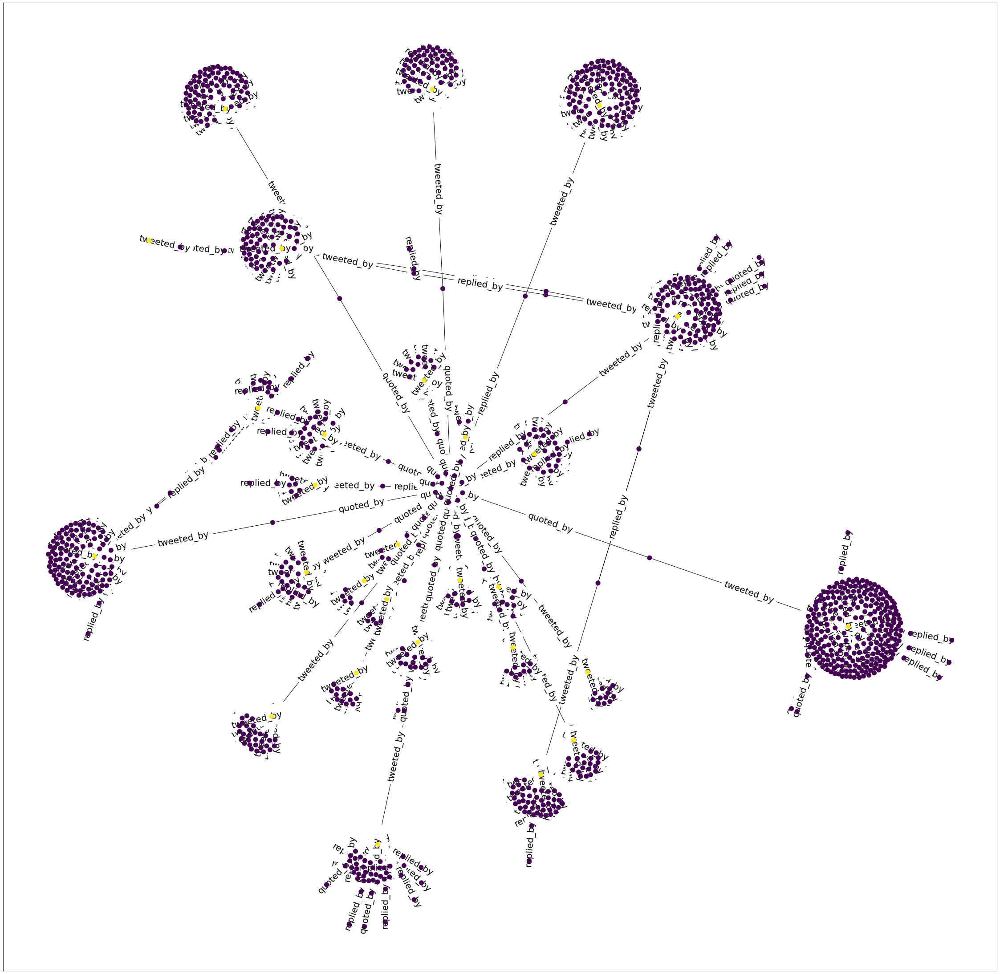

number of tweets: 1156
number of users: 28
Common keywords:  [('covid', 359), ('pandemic', 187), ('mask', 159), ('help', 157), ('coronavirus', 151), ('people', 113), ('trump', 111), ('need', 99), ('wear', 88), ('quarantine', 84), ('vaccine', 82), ('make', 79), ('test', 76), ('please', 76), ('work', 75), ('take', 70), ('come', 66), ('would', 64), ('president', 53), ('think', 51), ('really', 51), ('food', 51), ('still', 50), ('american', 49), ('know', 49), ('virus', 47), ('rent', 45), ('life', 44), ('want', 43), ('year', 43), ('first', 41), ('even', 41), ('good', 40), ('death', 39), ('without', 39), ("can't", 38), ('today', 35), ('state', 35), ('month', 35), ('case', 34), ('could', 34), ('right', 34), ('thing', 34), ('healthcare', 34), ('child', 33), ('california', 32), ('china', 32), ('feel', 32), ('tell', 31), ('country', 31), ('positive', 31), ('back', 31), ('everyone', 31), ('lose', 30), ("trump's", 30), ('start', 29), ('lockdown', 29), ('health', 29), ('bill', 28), ('biden', 28), ('

<Figure size 432x288 with 0 Axes>

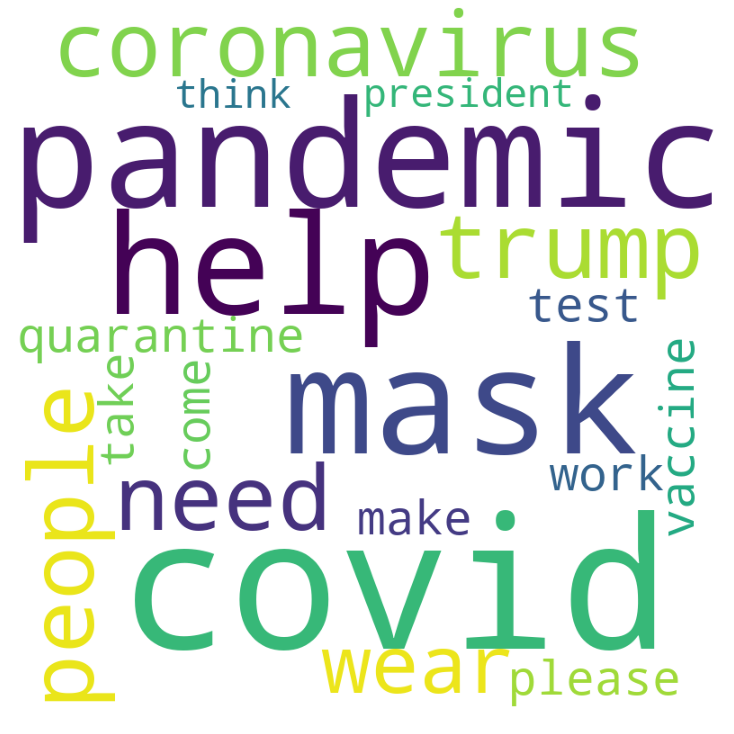

most common keywords: None


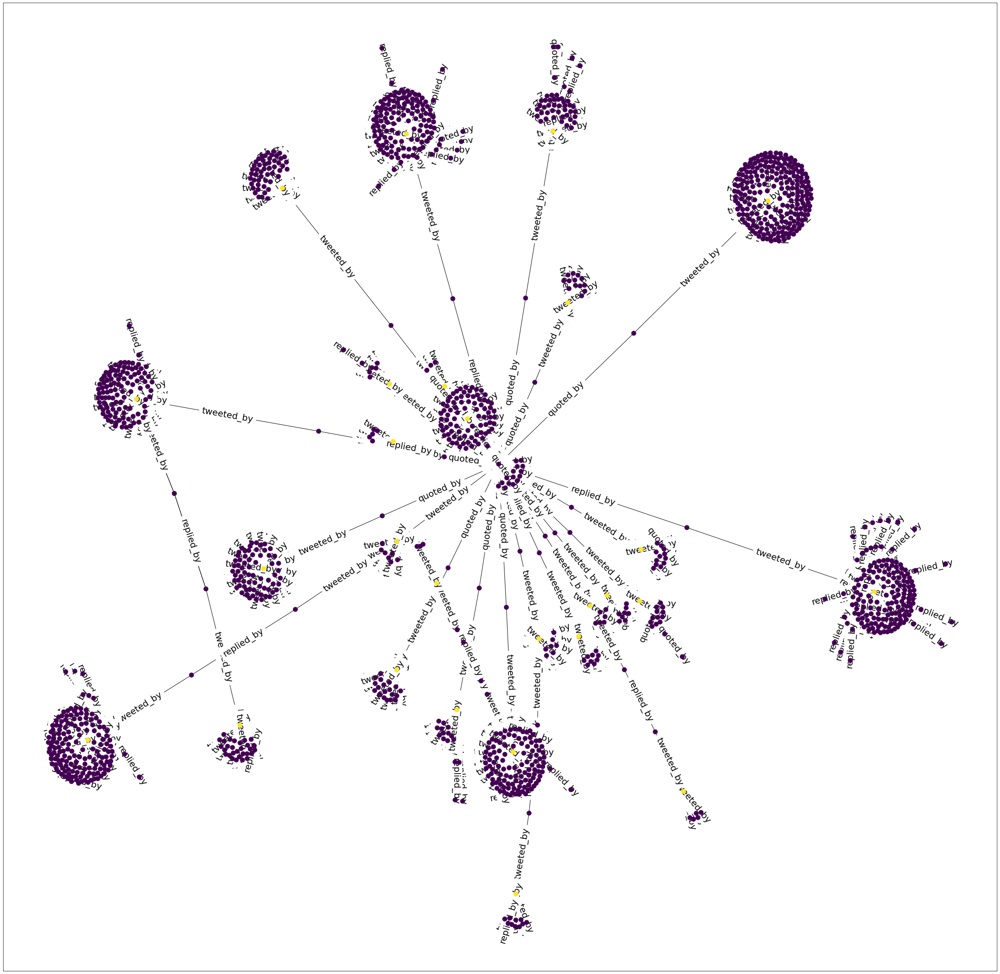

number of tweets: 1399
number of users: 27
Common keywords:  [('covid', 492), ('mask', 267), ('pandemic', 239), ('people', 205), ('coronavirus', 174), ('vaccine', 155), ('wear', 143), ('trump', 141), ('test', 100), ('american', 89), ('take', 89), ('need', 88), ('president', 81), ('want', 81), ('case', 80), ('death', 79), ('make', 78), ('work', 70), ('week', 65), ('know', 63), ('biden', 62), ('think', 62), ('state', 61), ('year', 59), ('would', 58), ('virus', 57), ('health', 56), ('every', 55), ('quarantine', 52), ('everyone', 52), ('today', 51), ('thing', 51), ('relief', 51), ('life', 51), ('first', 50), ('vote', 49), ('please', 48), ('tell', 48), ("can't", 47), ('help', 46), ('keep', 46), ('care', 46), ('many', 45), ('month', 45), ('republican', 44), ('could', 43), ('still', 43), ('million', 42), ('even', 42), ('really', 42), ('house', 41), ('refuse', 41), ('right', 41), ('come', 41), ('home', 41), ('good', 37), ("trump's", 37), ('call', 37), ('last', 36), ('hospital', 36), ('person',

<Figure size 432x288 with 0 Axes>

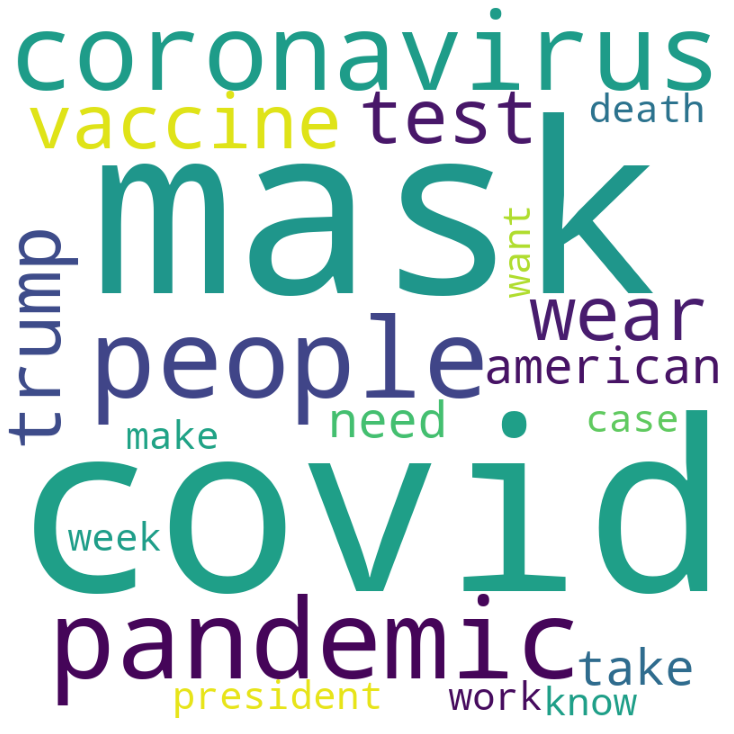

most common keywords: None


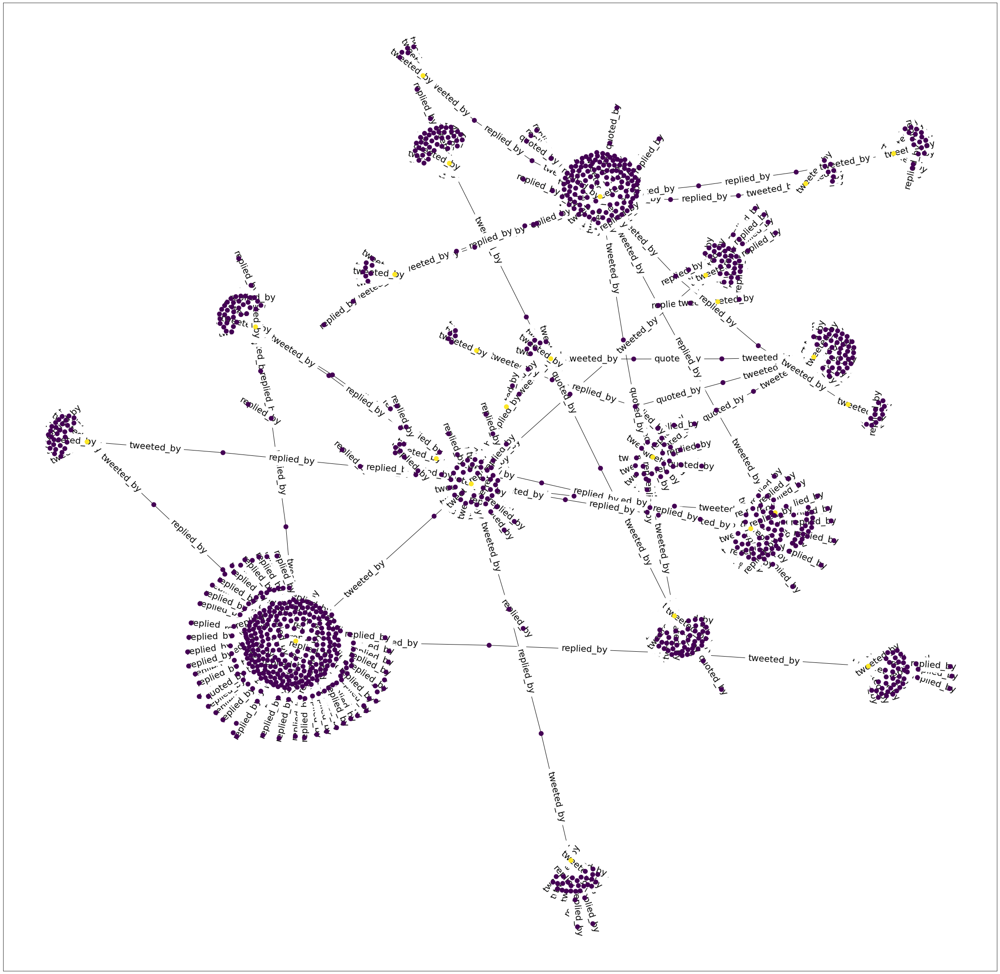

number of tweets: 1078
number of users: 24
Common keywords:  [('covid', 247), ('pandemic', 159), ('people', 119), ('quarantine', 100), ('mask', 96), ('coronavirus', 92), ('make', 77), ('test', 71), ('need', 67), ('work', 65), ('case', 61), ('vaccine', 59), ('take', 58), ('home', 52), ('think', 52), ('state', 49), ('good', 48), ('today', 48), ('first', 47), ('week', 46), ('wear', 46), ('corona', 45), ('city', 44), ('health', 44), ('know', 44), ('also', 43), ('year', 41), ('right', 41), ('rent', 40), ('give', 39), ('month', 39), ('help', 38), ('last', 36), ('feel', 36), ('want', 36), ('family', 36), ('come', 35), ('community', 35), ('county', 34), ('many', 34), ('never', 34), ('even', 33), ('thing', 33), ('country', 32), ('look', 32), ('really', 32), ('life', 32), ('back', 32), ('face', 32), ('would', 31), ('much', 31), ("we're", 31), ('tell', 31), ('crisis', 31), ('eviction', 31), ('lockdown', 31), ('death', 30), ('worker', 30), ('live', 30), ('healthcare', 29), ('start', 29), ('califor

<Figure size 432x288 with 0 Axes>

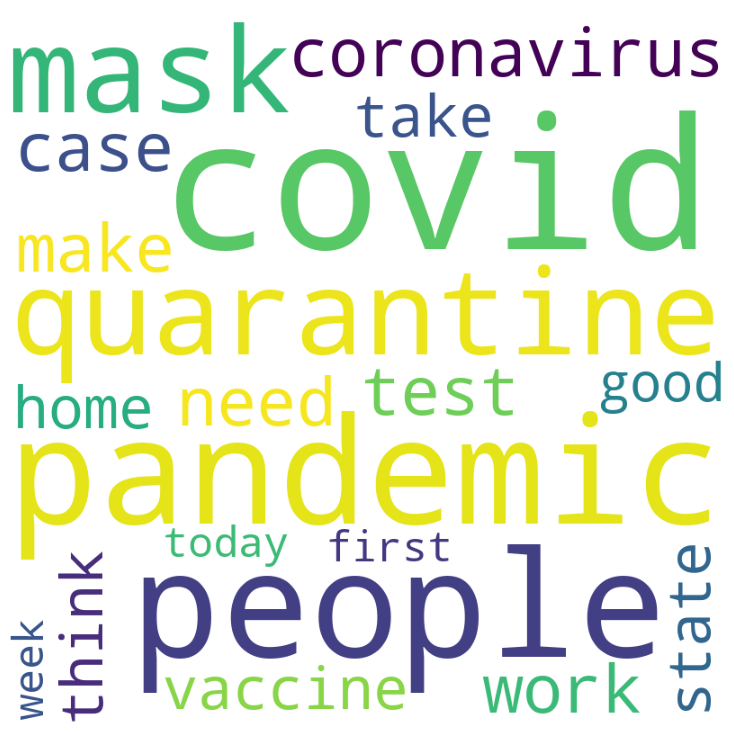

most common keywords: None


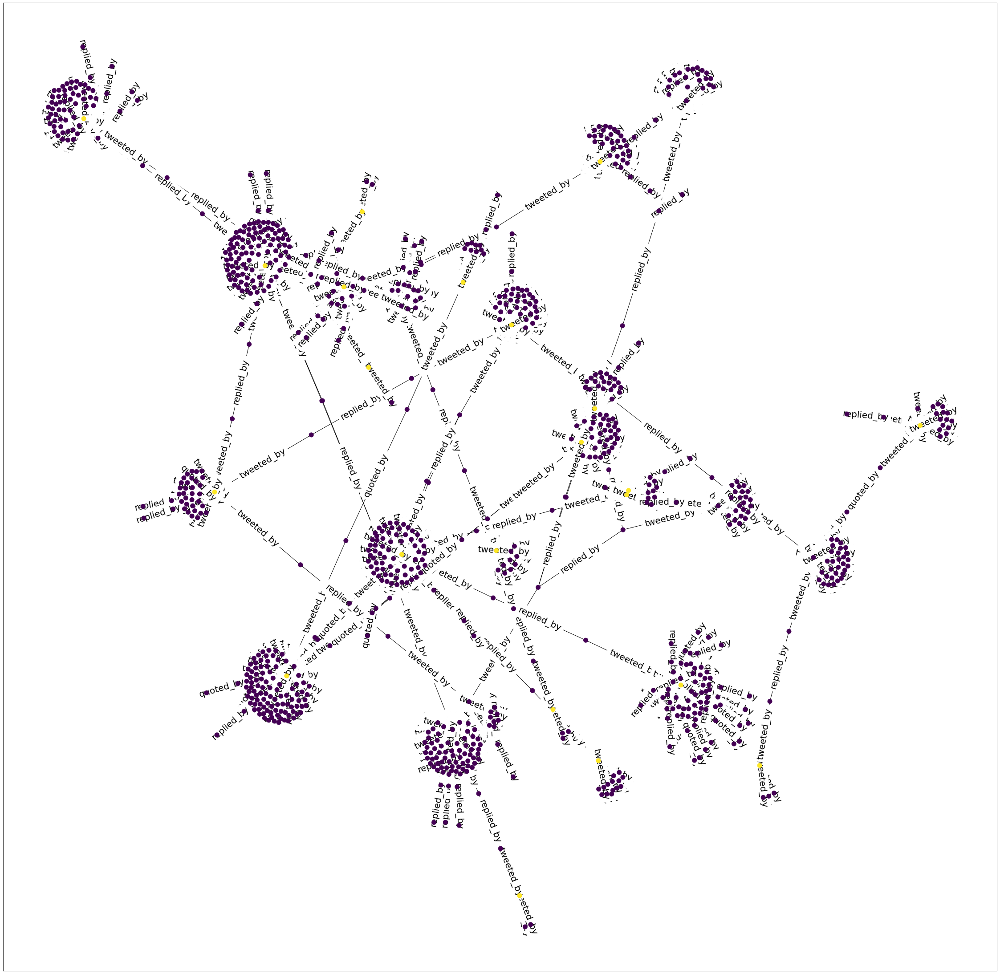

number of tweets: 911
number of users: 22
Common keywords:  [('covid', 248), ('quarantine', 133), ('mask', 107), ('test', 83), ('pandemic', 82), ('vaccine', 81), ('people', 79), ('wear', 57), ('make', 54), ('coronavirus', 53), ('come', 51), ('corona', 50), ('take', 50), ('back', 39), ('still', 39), ('positive', 37), ('work', 36), ('symptom', 36), ('really', 35), ('virus', 34), ('need', 32), ('want', 32), ('week', 31), ('case', 31), ('think', 30), ('everyone', 30), ('good', 30), ('tell', 29), ('know', 29), ('year', 29), ('give', 28), ('first', 28), ('friend', 28), ('since', 27), ('dream', 27), ('feel', 26), ('life', 26), ('month', 25), ('look', 25), ('last', 24), ('start', 24), ('today', 24), ('also', 24), ('right', 22), ('would', 22), ('stay', 21), ('lockdown', 21), ('hand', 19), ('live', 19), ('home', 19), ('thing', 19), ("can't", 18), ('lose', 18), ('well', 17), ('stop', 17), ('night', 17), ('china', 17), ('call', 16), ('close', 16), ('find', 16), ('someone', 16), ('even', 16), ('wai

<Figure size 432x288 with 0 Axes>

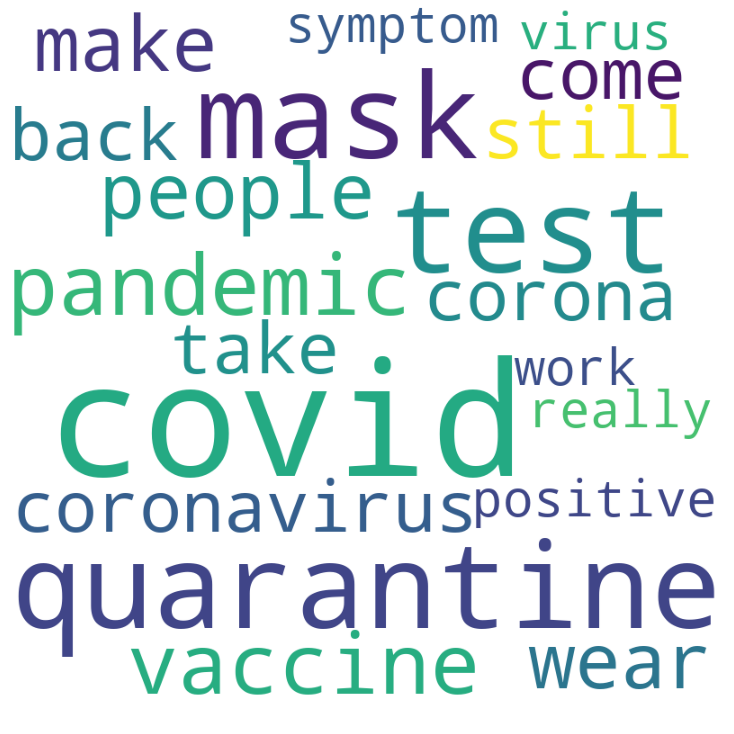

most common keywords: None


In [ ]:
for i in dict_by_community_sorted[4:8]:
  plot_one_community(i, partition,partition_dict_by_community, G)
  print("number of tweets:", number_of_tweets(i, G, partition, partition_dict_by_community))
  print("number of users:" ,number_of_users(i, G, partition, partition_dict_by_community))
  print("most common keywords:", print_most_common_keywords(find_common_keyword(i, G,partition,partition_dict_by_community), 20))



150
number of tweets: 2086
number of users: 83
Common keywords:  [('covid', 451), ('quarantine', 376), ('mask', 287), ('coronavirus', 221), ('people', 209), ('pandemic', 182), ('right', 139), ('wear', 135), ('make', 118), ('test', 113), ('death', 112), ('corona', 110), ('california', 104), ('week', 99), ('take', 98), ('know', 96), ('vaccine', 96), ('virus', 89), ('work', 87), ('need', 84), ('beach', 84), ('lockdown', 80), ('surge', 79), ('toll', 79), ('think', 78), ('southern', 77), ('come', 75), ('newport', 75), ('scene', 74), ('want', 73), ('case', 72), ("can't", 71), ('china', 70), ('good', 69), ('help', 67), ('first', 65), ('home', 63), ('even', 62), ('state', 62), ('still', 62), ('every', 61), ('tell', 58), ('today', 57), ('health', 57), ('stay', 56), ('would', 55), ('really', 53), ('please', 53), ('since', 53), ('everyone', 53), ('year', 52), ('many', 52), ('start', 52), ('feel', 51), ('healthcare', 51), ('back', 49), ('trump', 49), ('life', 49), ('positive', 48), ('color', 48), 

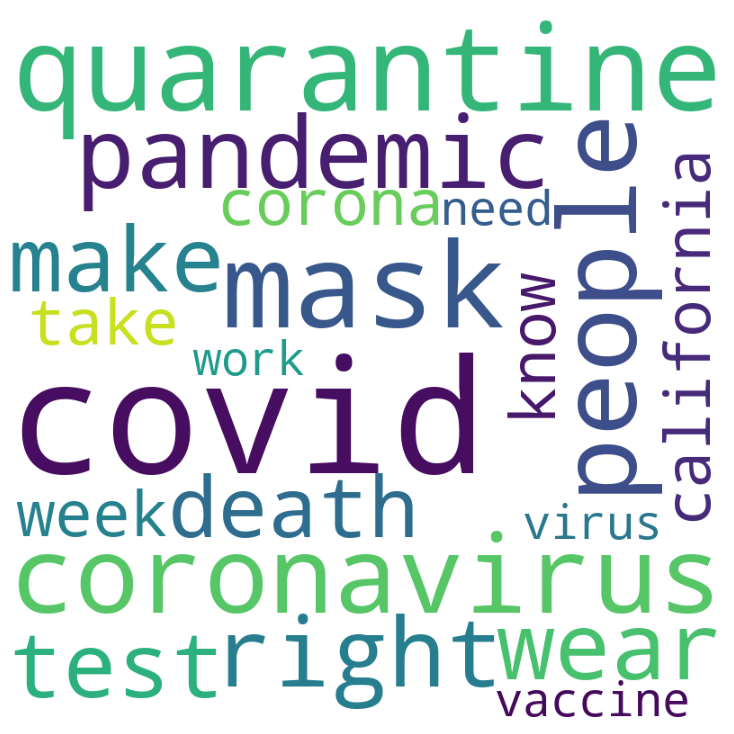

most common keywords: None
812
number of tweets: 1504
number of users: 34
Common keywords:  [('covid', 312), ('quarantine', 227), ('pandemic', 184), ('mask', 151), ('people', 110), ('vaccine', 104), ('coronavirus', 82), ('know', 77), ('take', 76), ('test', 71), ('make', 69), ('think', 60), ('wear', 52), ('come', 47), ('start', 47), ('want', 46), ('week', 46), ('thing', 45), ('work', 45), ('right', 44), ('back', 44), ('first', 44), ('need', 43), ('month', 42), ('post', 42), ('today', 41), ('also', 40), ('feel', 40), ('good', 39), ('look', 38), ('last', 38), ('would', 36), ('show', 36), ("can't", 35), ('since', 35), ('really', 34), ('home', 33), ('everyone', 33), ('never', 33), ('corona', 32), ('still', 32), ('long', 31), ('find', 31), ('even', 30), ('friend', 29), ('watch', 29), ('year', 29), ('love', 28), ('every', 27), ('tell', 27), ('next', 27), ('dude', 27), ('talk', 26), ('well', 26), ('lockdown', 26), ('real', 26), ('leave', 26), ('life', 25), ('much', 25), ('give', 25), ('someone

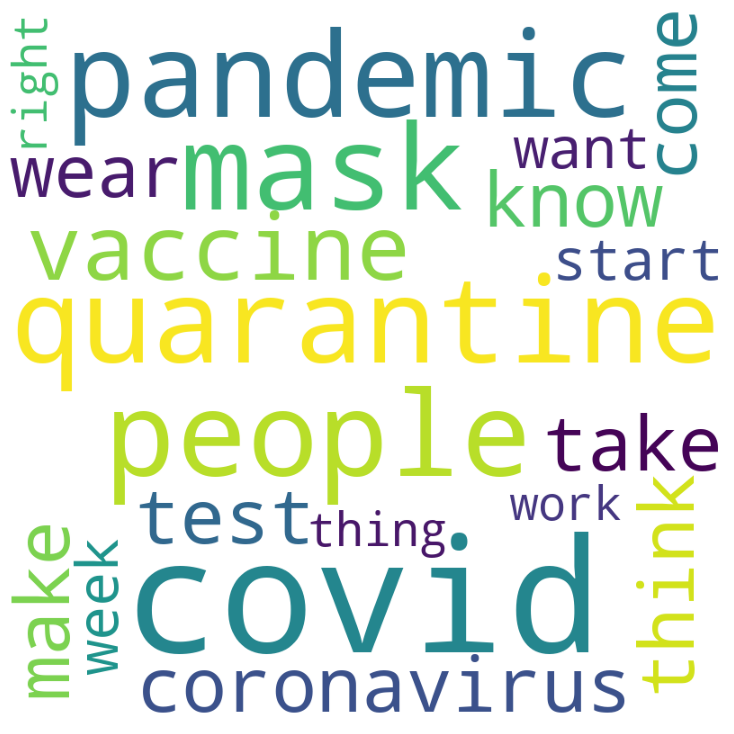

most common keywords: None
387
number of tweets: 1439
number of users: 34
Common keywords:  [('covid', 324), ('mask', 279), ('pandemic', 159), ('quarantine', 144), ('wear', 137), ('coronavirus', 125), ('people', 120), ('test', 102), ('take', 76), ('make', 75), ('vaccine', 74), ('need', 62), ('think', 61), ('trump', 59), ('know', 55), ('start', 50), ('still', 50), ('would', 49), ('home', 48), ('case', 48), ('want', 46), ('back', 46), ('work', 46), ('keep', 45), ('tell', 45), ('today', 44), ('even', 43), ('positive', 43), ('virus', 42), ('look', 42), ('year', 42), ('love', 42), ('first', 40), ('good', 37), ('life', 36), ('stay', 36), ('everyone', 35), ('thing', 35), ('could', 35), ('leave', 35), ('show', 34), ('many', 34), ('find', 34), ('school', 33), ('open', 32), ('come', 32), ('right', 31), ('also', 31), ('help', 31), ("can't", 31), ('corona', 30), ('every', 30), ('house', 30), ('spread', 29), ('well', 29), ('hand', 29), ('give', 29), ('much', 29), ('last', 29), ('protect', 28), ("he

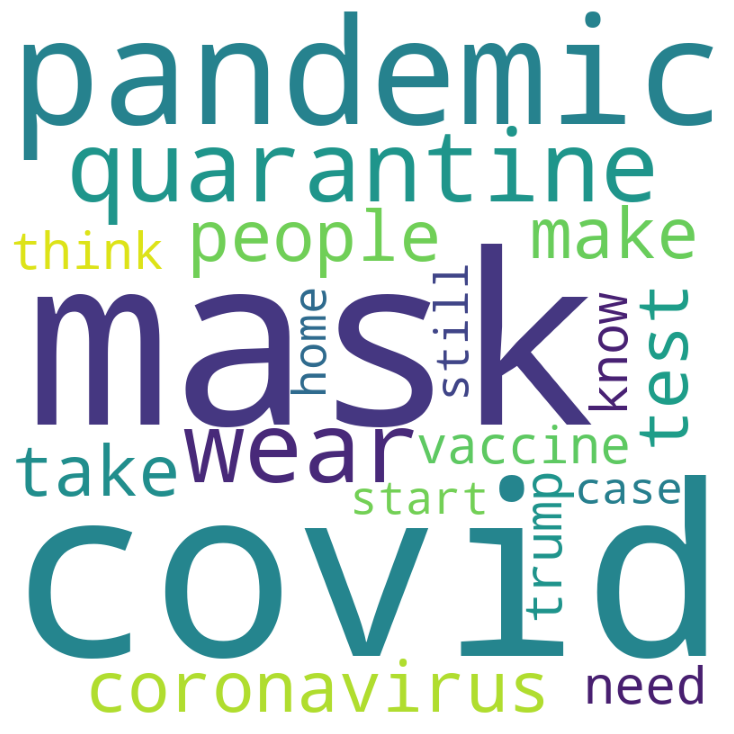

most common keywords: None
1239
number of tweets: 1710
number of users: 31
Common keywords:  [('covid', 581), ('coronavirus', 309), ('trump', 283), ('mask', 231), ('pandemic', 213), ('vaccine', 201), ('people', 183), ('wear', 125), ('state', 115), ('president', 111), ('million', 103), ('case', 103), ('china', 101), ('test', 97), ('take', 96), ('house', 96), ('quarantine', 92), ('virus', 90), ('american', 86), ('white', 85), ('death', 84), ('know', 79), ('need', 77), ('reveals', 76), ("trump's", 75), ('country', 73), ('first', 72), ('make', 69), ('work', 68), ('want', 68), ('would', 65), ('think', 64), ("he's", 64), ('biden', 60), ('home', 60), ('lockdown', 60), ('news', 59), ('still', 58), ('week', 56), ('come', 55), ('plan', 55), ('angeles', 55), ('vaccination', 55), ('year', 54), ('today', 54), ('back', 54), ('world', 52), ('even', 52), ('call', 50), ('face', 50), ('give', 50), ('election', 50), ('start', 49), ('tell', 49), ('open', 49), ('healthcare', 47), ('united', 47), ('since', 

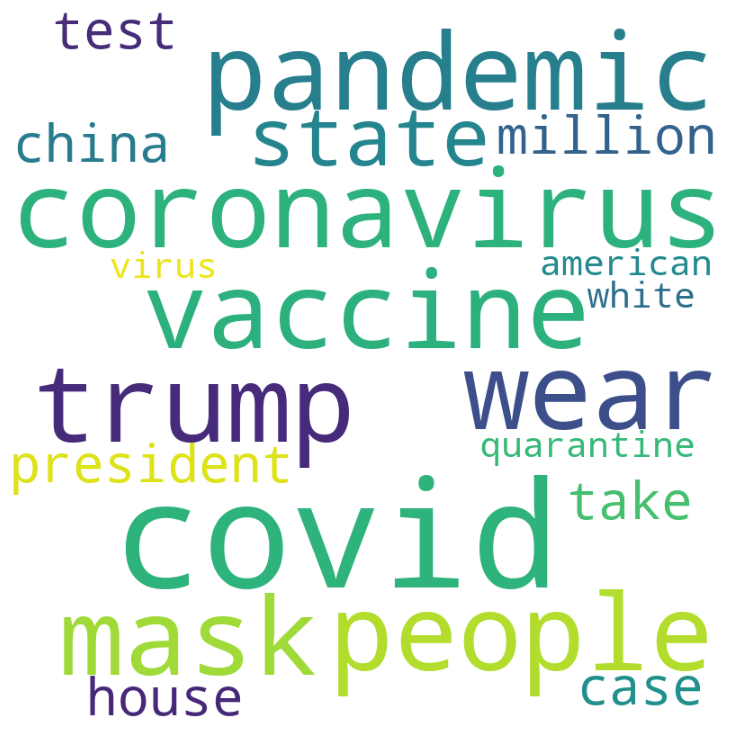

most common keywords: None
2081
number of tweets: 1091
number of users: 29
Common keywords:  [('covid', 317), ('mask', 132), ('people', 124), ('test', 118), ('death', 117), ('pandemic', 114), ('coronavirus', 109), ('china', 91), ('virus', 73), ('know', 69), ('home', 69), ('million', 67), ('vaccine', 61), ('make', 60), ('year', 59), ('think', 57), ('case', 57), ('take', 56), ('wear', 55), ('would', 52), ('need', 52), ('work', 50), ('trump', 49), ('week', 48), ('rate', 48), ('lockdown', 47), ('state', 47), ('right', 45), ('good', 44), ('number', 44), ('today', 43), ('patient', 42), ('come', 41), ('back', 41), ('team', 40), ('positive', 40), ('population', 40), ('stay', 39), ('even', 39), ('quarantine', 37), ('want', 36), ('first', 34), ('start', 33), ('democrat', 33), ('county', 33), ('president', 31), ('high', 31), ('country', 30), ('tell', 30), ('give', 30), ('every', 29), ('still', 29), ('stop', 29), ('close', 29), ('hospital', 29), ('mean', 29), ('month', 28), ('well', 28), ('califor

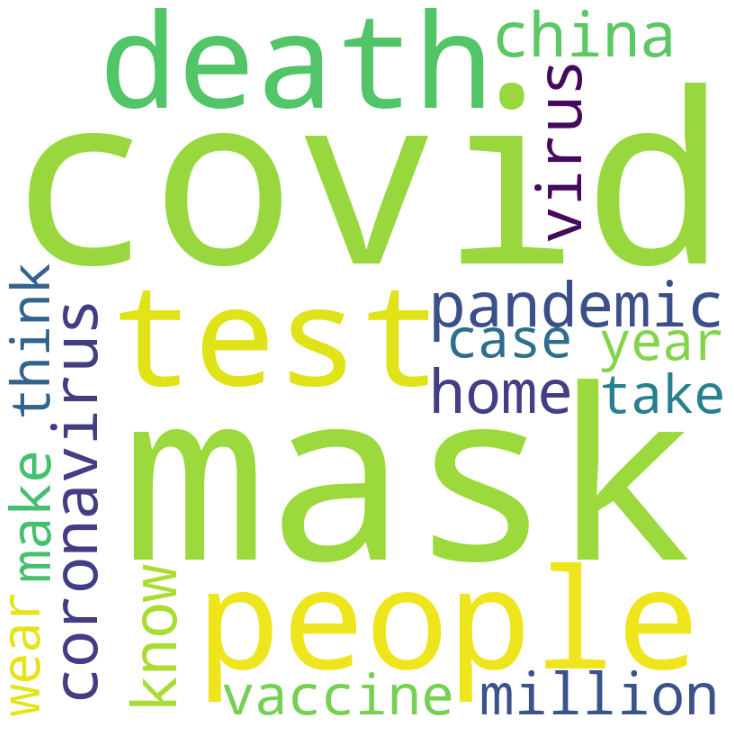

most common keywords: None
626
number of tweets: 1156
number of users: 28
Common keywords:  [('covid', 359), ('pandemic', 187), ('mask', 159), ('help', 157), ('coronavirus', 151), ('people', 113), ('trump', 111), ('need', 99), ('wear', 88), ('quarantine', 84), ('vaccine', 82), ('make', 79), ('test', 76), ('please', 76), ('work', 75), ('take', 70), ('come', 66), ('would', 64), ('president', 53), ('think', 51), ('really', 51), ('food', 51), ('still', 50), ('american', 49), ('know', 49), ('virus', 47), ('rent', 45), ('life', 44), ('want', 43), ('year', 43), ('first', 41), ('even', 41), ('good', 40), ('death', 39), ('without', 39), ("can't", 38), ('today', 35), ('state', 35), ('month', 35), ('case', 34), ('could', 34), ('right', 34), ('thing', 34), ('healthcare', 34), ('child', 33), ('california', 32), ('china', 32), ('feel', 32), ('tell', 31), ('country', 31), ('positive', 31), ('back', 31), ('everyone', 31), ('lose', 30), ("trump's", 30), ('start', 29), ('lockdown', 29), ('health', 29), 

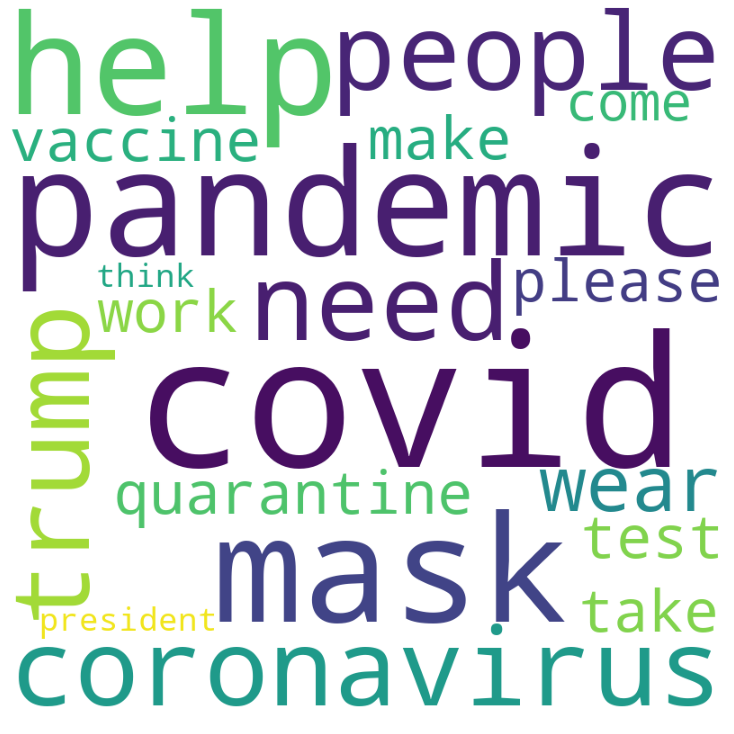

most common keywords: None
539
number of tweets: 1399
number of users: 27
Common keywords:  [('covid', 492), ('mask', 267), ('pandemic', 239), ('people', 205), ('coronavirus', 174), ('vaccine', 155), ('wear', 143), ('trump', 141), ('test', 100), ('american', 89), ('take', 89), ('need', 88), ('president', 81), ('want', 81), ('case', 80), ('death', 79), ('make', 78), ('work', 70), ('week', 65), ('know', 63), ('biden', 62), ('think', 62), ('state', 61), ('year', 59), ('would', 58), ('virus', 57), ('health', 56), ('every', 55), ('quarantine', 52), ('everyone', 52), ('today', 51), ('thing', 51), ('relief', 51), ('life', 51), ('first', 50), ('vote', 49), ('please', 48), ('tell', 48), ("can't", 47), ('help', 46), ('keep', 46), ('care', 46), ('many', 45), ('month', 45), ('republican', 44), ('could', 43), ('still', 43), ('million', 42), ('even', 42), ('really', 42), ('house', 41), ('refuse', 41), ('right', 41), ('come', 41), ('home', 41), ('good', 37), ("trump's", 37), ('call', 37), ('last', 36

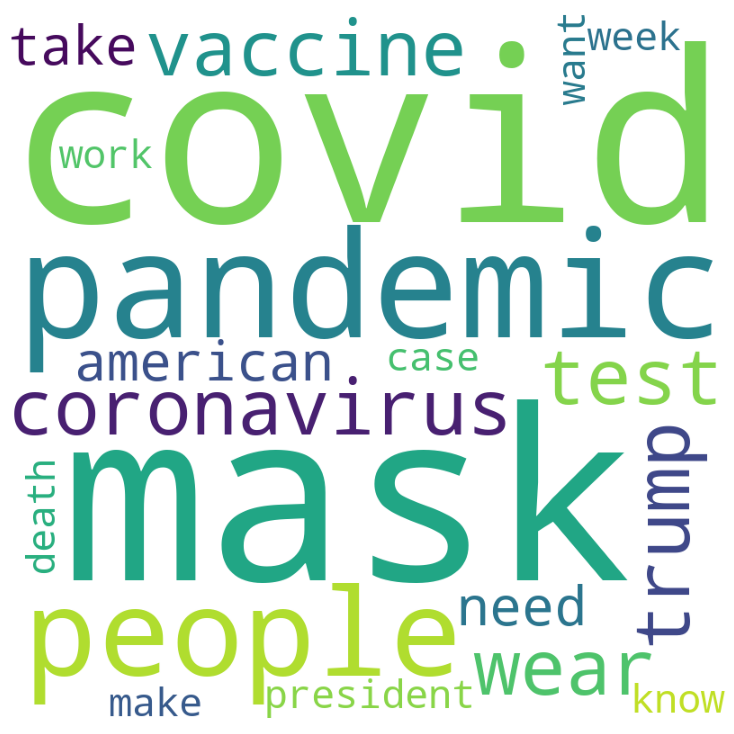

most common keywords: None
713
number of tweets: 1078
number of users: 24
Common keywords:  [('covid', 247), ('pandemic', 159), ('people', 119), ('quarantine', 100), ('mask', 96), ('coronavirus', 92), ('make', 77), ('test', 71), ('need', 67), ('work', 65), ('case', 61), ('vaccine', 59), ('take', 58), ('home', 52), ('think', 52), ('state', 49), ('good', 48), ('today', 48), ('first', 47), ('week', 46), ('wear', 46), ('corona', 45), ('city', 44), ('health', 44), ('know', 44), ('also', 43), ('year', 41), ('right', 41), ('rent', 40), ('give', 39), ('month', 39), ('help', 38), ('last', 36), ('feel', 36), ('want', 36), ('family', 36), ('come', 35), ('community', 35), ('county', 34), ('many', 34), ('never', 34), ('even', 33), ('thing', 33), ('country', 32), ('look', 32), ('really', 32), ('life', 32), ('back', 32), ('face', 32), ('would', 31), ('much', 31), ("we're", 31), ('tell', 31), ('crisis', 31), ('eviction', 31), ('lockdown', 31), ('death', 30), ('worker', 30), ('live', 30), ('healthcare'

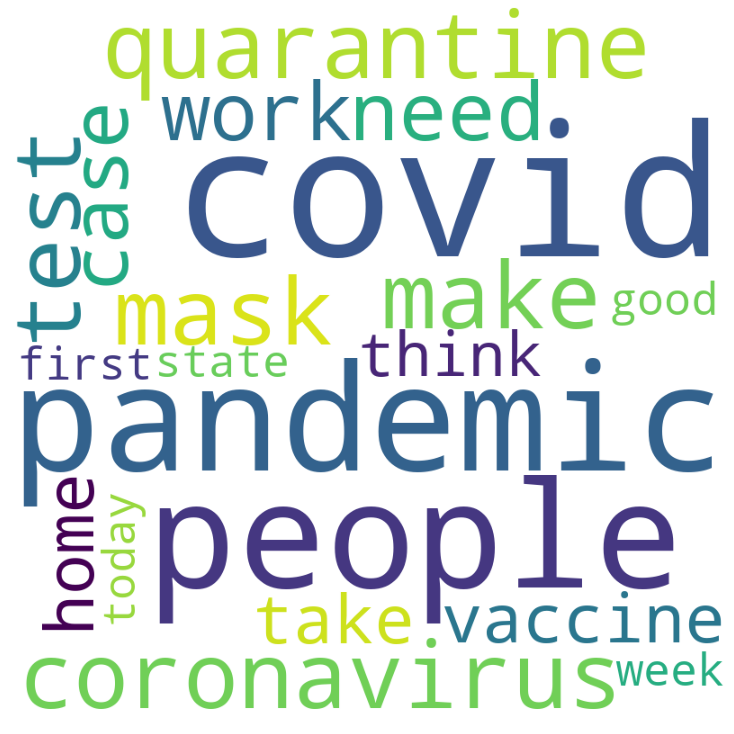

most common keywords: None
272
number of tweets: 1179
number of users: 23
Common keywords:  [('covid', 337), ('mask', 178), ('coronavirus', 137), ('people', 133), ('pandemic', 121), ('case', 99), ('test', 98), ('wear', 92), ('vaccine', 86), ('trump', 72), ('make', 64), ('health', 60), ('please', 60), ('week', 57), ('take', 55), ('county', 53), ('first', 52), ('today', 51), ('quarantine', 51), ('work', 48), ('death', 46), ('help', 46), ('know', 44), ('angeles', 42), ('state', 42), ('think', 42), ('still', 42), ('need', 42), ('community', 42), ('come', 41), ('back', 41), ('home', 40), ('positive', 40), ('report', 38), ('president', 35), ('stay', 35), ('virus', 34), ('right', 34), ('year', 33), ('want', 33), ('would', 33), ('spread', 32), ('california', 32), ('since', 31), ('month', 30), ('good', 30), ('look', 30), ('biden', 30), ('world', 29), ('number', 29), ('close', 28), ('start', 28), ('give', 28), ('even', 28), ('many', 28), ('could', 27), ('hope', 27), ('public', 27), ('open', 27),

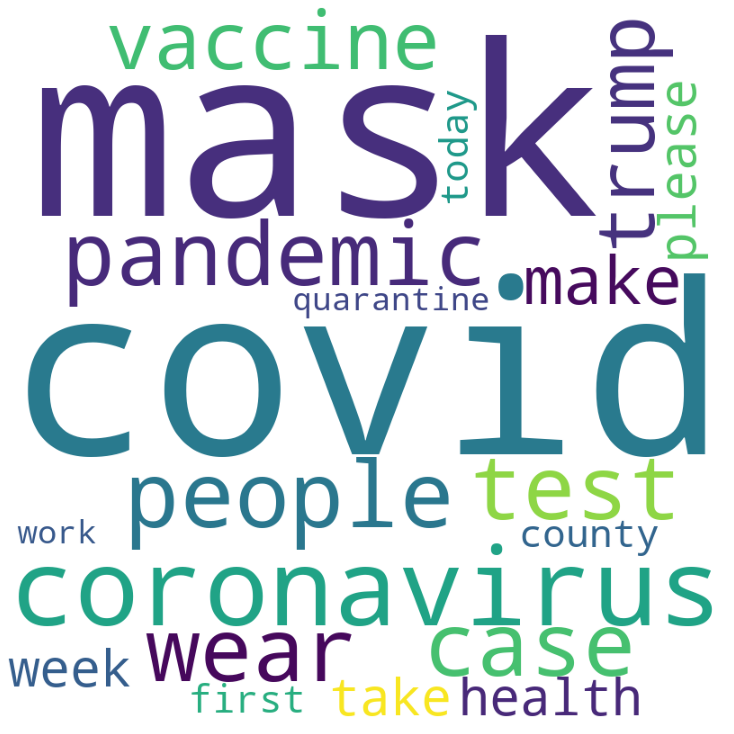

most common keywords: None
2780
number of tweets: 911
number of users: 22
Common keywords:  [('covid', 248), ('quarantine', 133), ('mask', 107), ('test', 83), ('pandemic', 82), ('vaccine', 81), ('people', 79), ('wear', 57), ('make', 54), ('coronavirus', 53), ('come', 51), ('corona', 50), ('take', 50), ('back', 39), ('still', 39), ('positive', 37), ('work', 36), ('symptom', 36), ('really', 35), ('virus', 34), ('need', 32), ('want', 32), ('week', 31), ('case', 31), ('think', 30), ('everyone', 30), ('good', 30), ('tell', 29), ('know', 29), ('year', 29), ('give', 28), ('first', 28), ('friend', 28), ('since', 27), ('dream', 27), ('feel', 26), ('life', 26), ('month', 25), ('look', 25), ('last', 24), ('start', 24), ('today', 24), ('also', 24), ('right', 22), ('would', 22), ('stay', 21), ('lockdown', 21), ('hand', 19), ('live', 19), ('home', 19), ('thing', 19), ("can't", 18), ('lose', 18), ('well', 17), ('stop', 17), ('night', 17), ('china', 17), ('call', 16), ('close', 16), ('find', 16), ('so

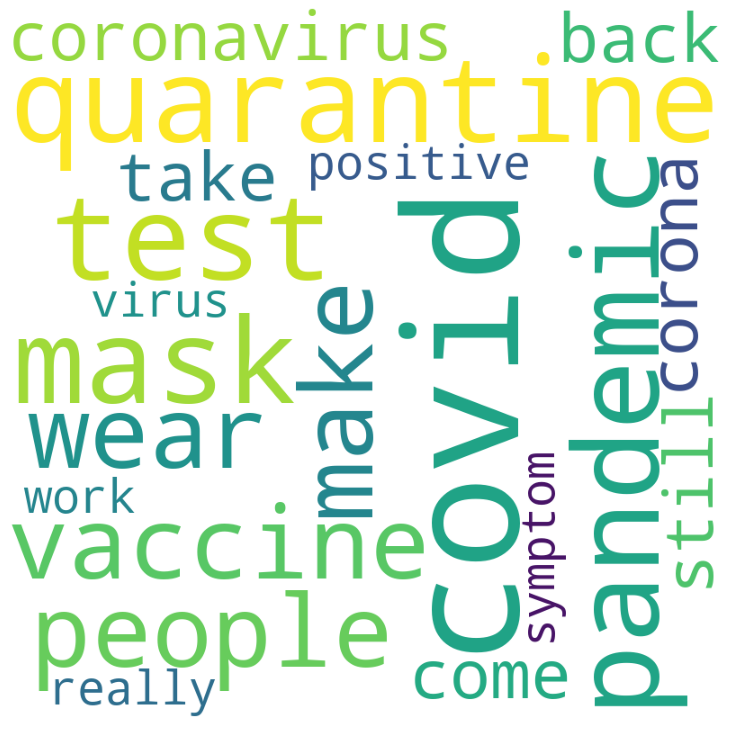

most common keywords: None
2418
number of tweets: 798
number of users: 21
Common keywords:  [('covid', 314), ('mask', 145), ('test', 103), ('vaccine', 75), ('coronavirus', 67), ('people', 67), ('wear', 65), ('game', 60), ('week', 59), ('pandemic', 55), ('football', 52), ('positive', 52), ('case', 48), ('back', 46), ('know', 44), ('make', 44), ('school', 44), ('team', 43), ('play', 41), ('take', 40), ('today', 40), ('good', 38), ('work', 38), ('state', 38), ('would', 37), ('quarantine', 36), ('season', 35), ('coach', 34), ('player', 34), ('thing', 31), ('first', 30), ('tell', 30), ('update', 30), ('right', 30), ('still', 29), ('look', 29), ('sport', 29), ('come', 29), ('last', 28), ('county', 27), ('china', 26), ('million', 26), ('health', 26), ('high', 26), ('think', 25), ('need', 25), ('great', 25), ('death', 24), ('report', 24), ('call', 24), ('many', 23), ('number', 23), ('start', 23), ('month', 23), ('california', 23), ('could', 22), ('well', 22), ('home', 22), ('even', 21), ('show

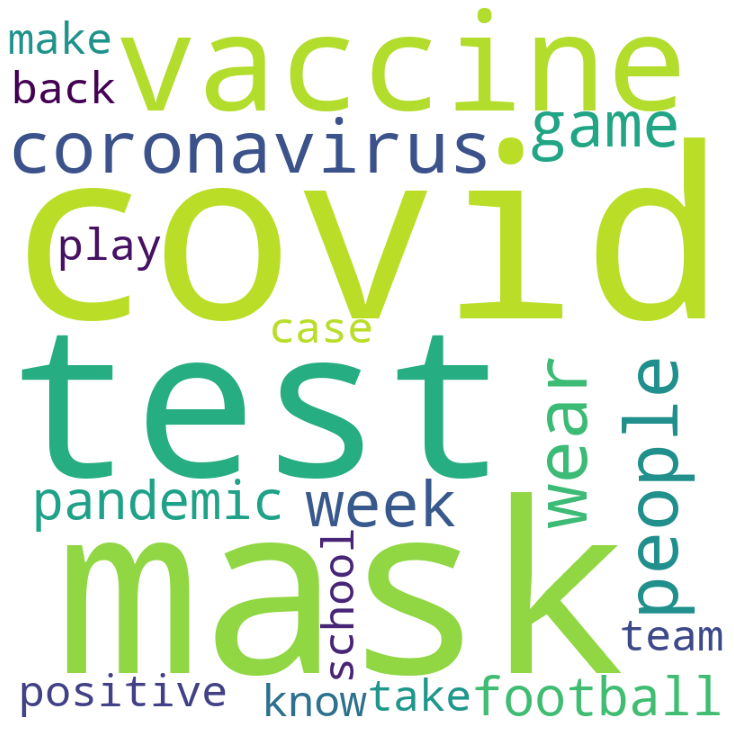

most common keywords: None
813
number of tweets: 708
number of users: 21
Common keywords:  [('quarantine', 137), ('covid', 132), ('pandemic', 86), ('mask', 80), ('people', 57), ('corona', 56), ('know', 46), ('coronavirus', 43), ('make', 33), ('test', 29), ('think', 29), ('work', 27), ('home', 26), ('still', 26), ("can't", 25), ('virus', 24), ('wear', 24), ('even', 23), ('stay', 23), ('take', 23), ('thing', 23), ('week', 23), ('need', 22), ('trump', 21), ('look', 21), ('year', 21), ('want', 21), ('really', 20), ('right', 20), ('back', 20), ('start', 18), ('life', 17), ('china', 17), ('first', 17), ('come', 17), ('last', 16), ('good', 16), ('stop', 16), ('also', 16), ('whole', 16), ('case', 16), ('might', 16), ('show', 16), ("they're", 15), ('lockdown', 15), ('live', 15), ('love', 15), ('next', 15), ('much', 15), ('gotta', 14), ('everyone', 14), ('would', 14), ('tell', 14), ('vaccine', 13), ('keep', 13), ('nothing', 13), ('order', 13), ('california', 13), ('watch', 12), ('crazy', 12), ('

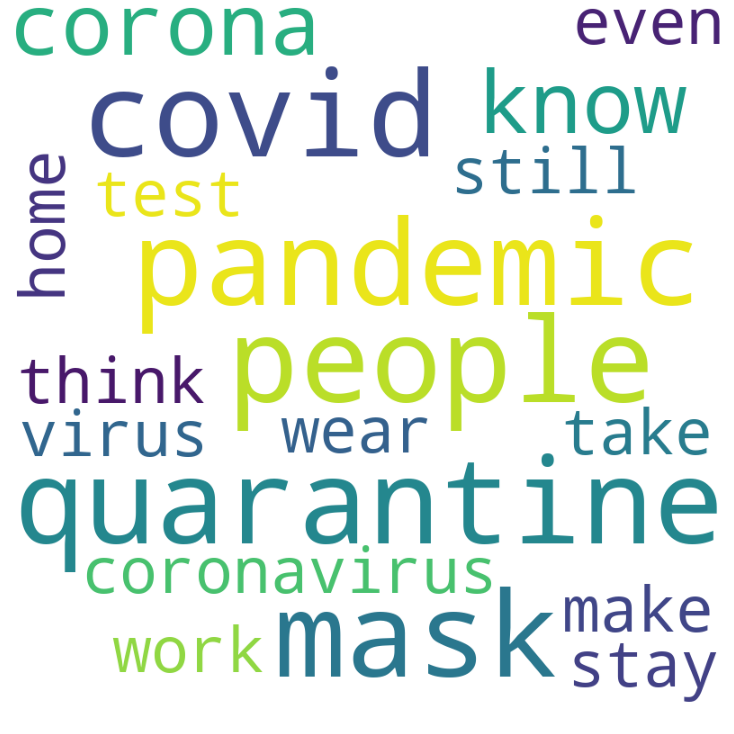

most common keywords: None
1707
number of tweets: 412
number of users: 21
Common keywords:  [('covid', 119), ('mask', 59), ('people', 44), ('case', 43), ('pandemic', 38), ('test', 36), ('coronavirus', 30), ('wear', 30), ('know', 28), ('take', 25), ('week', 24), ('county', 24), ('today', 24), ('need', 23), ('first', 23), ('vaccine', 22), ('angeles', 21), ('make', 20), ('quarantine', 19), ('last', 19), ('work', 18), ('good', 18), ('home', 18), ('still', 18), ('death', 18), ('safe', 17), ('help', 17), ('health', 16), ('healthcare', 16), ('long', 15), ('month', 15), ('face', 15), ('worker', 15), ('think', 14), ('update', 14), ('since', 14), ('stay', 14), ('please', 14), ('give', 14), ('tell', 13), ('positive', 13), ('even', 13), ('back', 13), ('year', 13), ('want', 13), ('call', 12), ('everyone', 12), ('hospital', 12), ('hand', 12), ('symptom', 12), ('happy', 12), ('also', 12), ('family', 12), ('care', 11), ('food', 11), ('keep', 11), ('city', 11), ('beach', 11), ('right', 10), ('come', 10

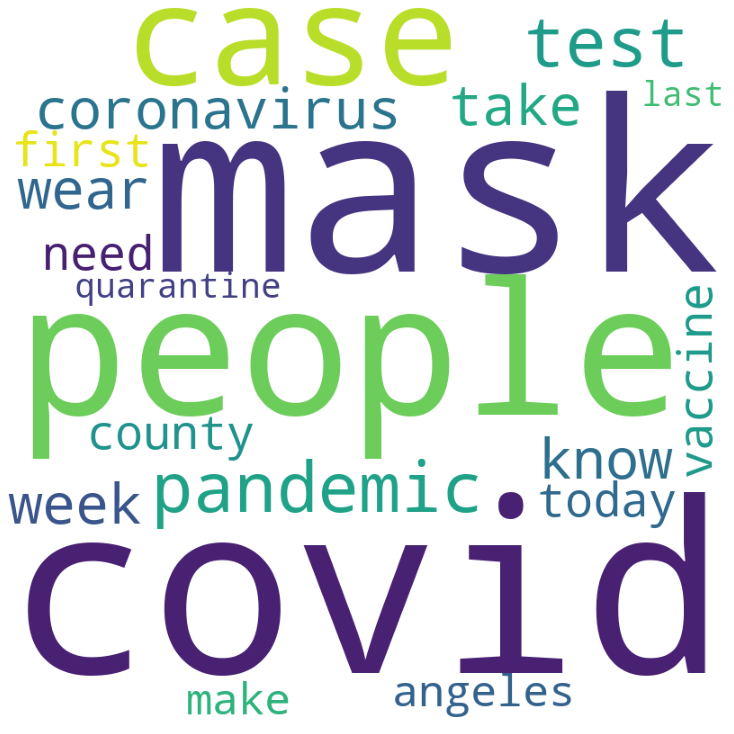

most common keywords: None
4610
number of tweets: 903
number of users: 20
Common keywords:  [('covid', 332), ('mask', 147), ('people', 100), ('coronavirus', 98), ('pandemic', 94), ('test', 77), ('quarantine', 74), ('vaccine', 62), ('make', 59), ('wear', 54), ('case', 52), ('positive', 48), ('work', 47), ('week', 47), ('know', 46), ('take', 42), ('need', 42), ('corona', 41), ('come', 40), ('back', 38), ('thing', 37), ('first', 34), ('would', 34), ('around', 33), ('start', 33), ('want', 33), ('home', 32), ('good', 31), ('trump', 31), ('still', 31), ('since', 30), ('county', 30), ("we're", 29), ('state', 29), ('tell', 29), ("can't", 28), ('think', 28), ('face', 27), ('year', 27), ('today', 26), ('right', 25), ('life', 25), ('also', 24), ('every', 24), ('death', 24), ('look', 24), ('last', 23), ('please', 23), ('month', 23), ('give', 22), ('symptom', 22), ('anyone', 22), ('help', 22), ('news', 22), ('even', 21), ('break', 21), ('really', 20), ('lockdown', 20), ('well', 20), ('everyone', 20

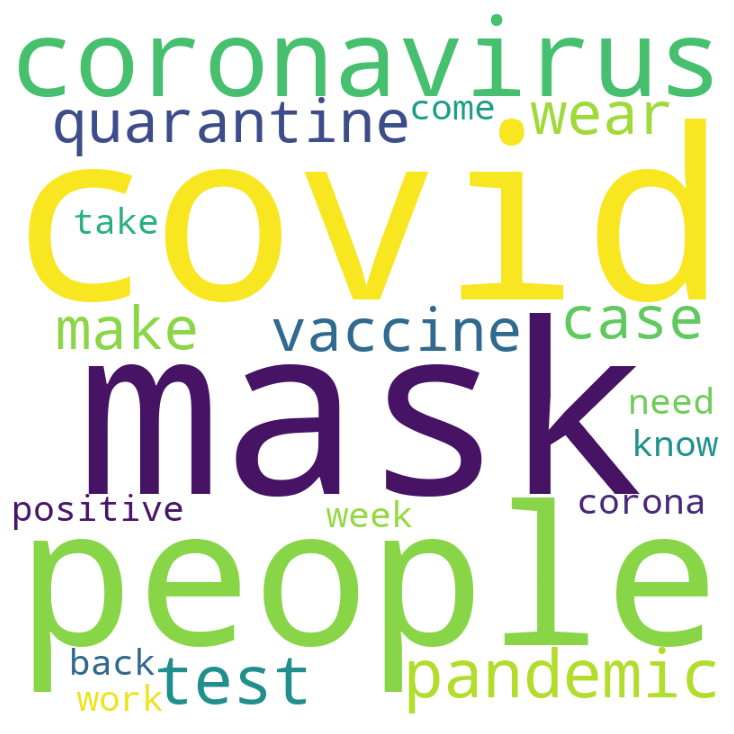

most common keywords: None
156
number of tweets: 1910
number of users: 19
Common keywords:  [('covid', 664), ('trump', 433), ('mask', 313), ('pandemic', 272), ('people', 254), ('coronavirus', 245), ('wear', 179), ('american', 172), ('test', 157), ('president', 148), ('take', 137), ('know', 130), ('death', 130), ('make', 127), ('china', 121), ('need', 117), ('state', 113), ('want', 113), ('case', 111), ('vaccine', 110), ('think', 106), ('would', 103), ('healthcare', 100), ("trump's", 92), ('work', 91), ("he's", 87), ('america', 83), ('million', 82), ('thousand', 77), ('still', 76), ('good', 75), ('virus', 73), ('care', 71), ('come', 70), ('response', 70), ('also', 70), ('plan', 69), ('week', 68), ('give', 66), ('white', 66), ('country', 66), ("can't", 66), ('today', 65), ('vote', 65), ('tell', 65), ('year', 64), ('help', 64), ('back', 64), ('keep', 63), ('call', 63), ('could', 63), ('biden', 61), ('thing', 60), ('right', 60), ('house', 59), ('show', 55), ('even', 55), ('life', 54), ('gr

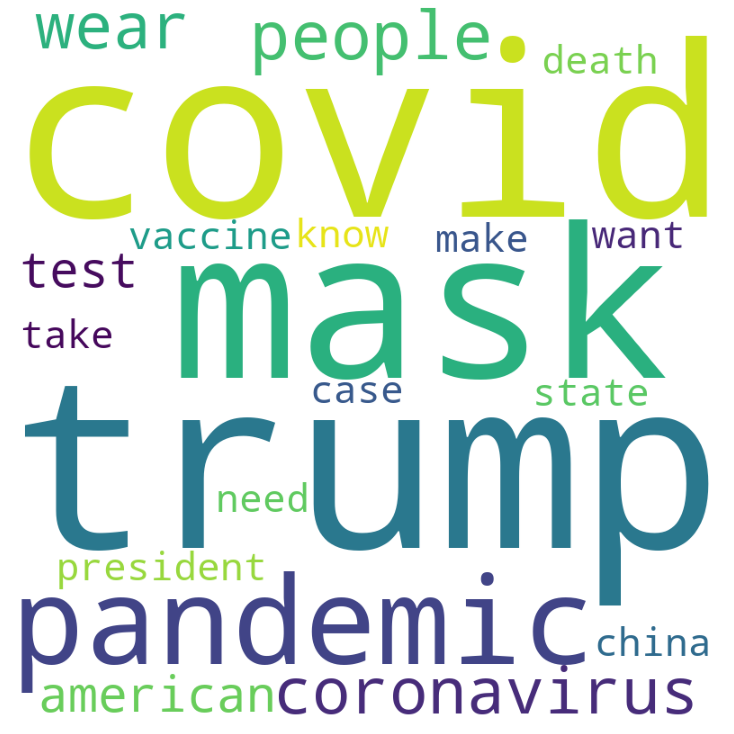

most common keywords: None


In [ ]:
for i in dict_by_community_sorted[:15]:
  print(i)
  print("number of tweets:", number_of_tweets(i, G, partition, partition_dict_by_community))
  print("number of users:" ,number_of_users(i, G, partition, partition_dict_by_community))
  print("most common keywords:", print_most_common_keywords(find_common_keyword(i, G,partition,partition_dict_by_community), 20))
  #plot_one_community(i, partition,partition_dict_by_community, G)

In [ ]:
N = dict_by_community_sorted[0]
node = partition_dict_by_community[N]
for node1 in node:
  for node2 in node:
    #undirected graph
    if ((node1, node2) in G.edges()) :
        print(node1, node2)

NameError: ignored

In [ ]:
#export as csv
# sentiment analysis

#Sentiment Analysis

In [ ]:
# sentiment changes by months with each community

#by communities
from collections import defaultdict
MONTH_ORDER = {"Jan": 0, "Feb": 1, "Mar": 2, "Apr": 3, "May": 4, "Jun": 5, "Jul": 6, "Aug": 7, "Sep": 8, "Oct": 9, "Nov": 10, "Dec": 11}

sentiment_dicts = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))
for tweet in jsons:
  if tweet['timestamp'] == None: continue
  sentiment_dicts[partition[str(tweet['tweet-id'])]][tweet['timestamp'][4:7]+' '+tweet['timestamp'][-4:]]["sentiment_score"].append(tweet["sentiment_score"])
  sentiment_dicts[partition[str(tweet['tweet-id'])]][tweet['timestamp'][4:7]+' '+tweet['timestamp'][-4:]]['text'].append(tweet["text"])
def sentiment_change_community(N: int, dict_by_community_sorted):
  for num in dict_by_community_sorted[N]:
    if (len(str(num)) >= 19) and (str(num).isdigit()):
      pass




In [ ]:
#plot by communities
def average_sentiment_score_by_communities(topics: [int], sentiment_dict):

  plt.figure(figsize=(150,60),dpi = 10)
  for i in topics: 
      sorted_dates = sorted(list(sentiment_dict[i].keys()), key=lambda x: (x[-4:],MONTH_ORDER[x[0:3]]))
     
      sentiments = [sum(sentiment_dict[i][time]['sentiment_score'])/len(sentiment_dict[i][time]['sentiment_score']) for time in sorted_dates]
      plt.plot(sorted_dates, sentiments, alpha = 0.8, label = i, color = 'red')


  plt.title('Sentiment Changes Mar 2020 - June 2021',fontsize = 120)
  #plt.ylim(-0.8,0.8)
  plt.xlabel('time', fontsize = 80)
  plt.legend(prop={'size':150})
  #plt.xticks(np.arange(0, len(sorted_dates)+1, 10))
  plt.ylabel('sentiment score',fontsize = 80)
  plt.tick_params(axis = 'x',which = 'major', labelsize = 80, rotation = 90)
  plt.tick_params(axis = 'y',which = 'major', labelsize = 80)

  plt.show()
  plt.savefig('Sentiment_changes_over_communities_Mar 2020 - June 2021.png')

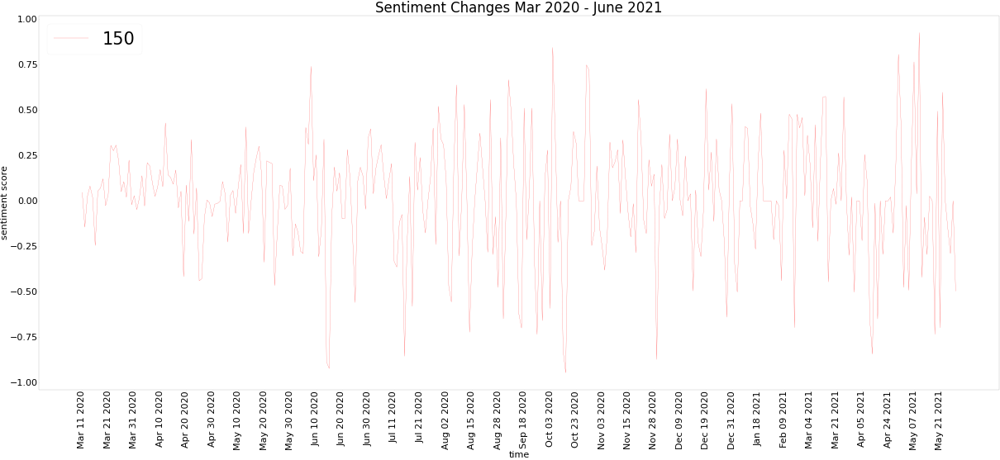

<Figure size 432x288 with 0 Axes>

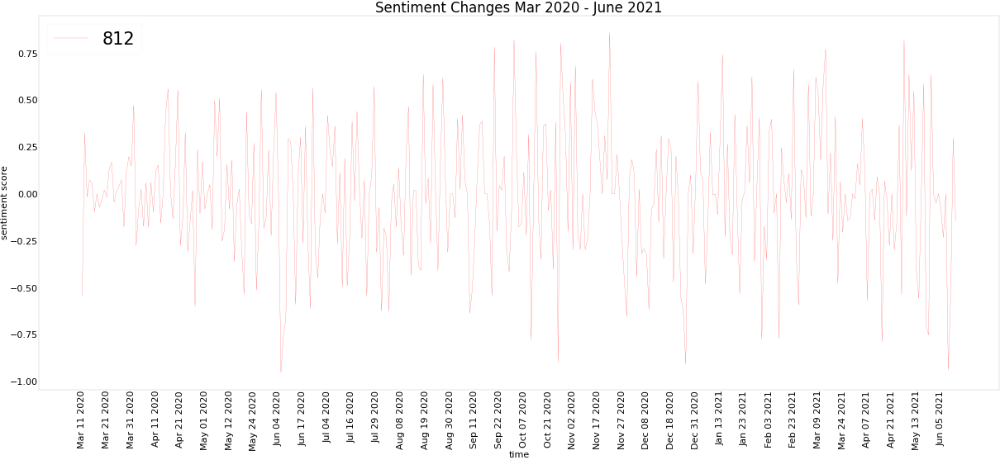

<Figure size 432x288 with 0 Axes>

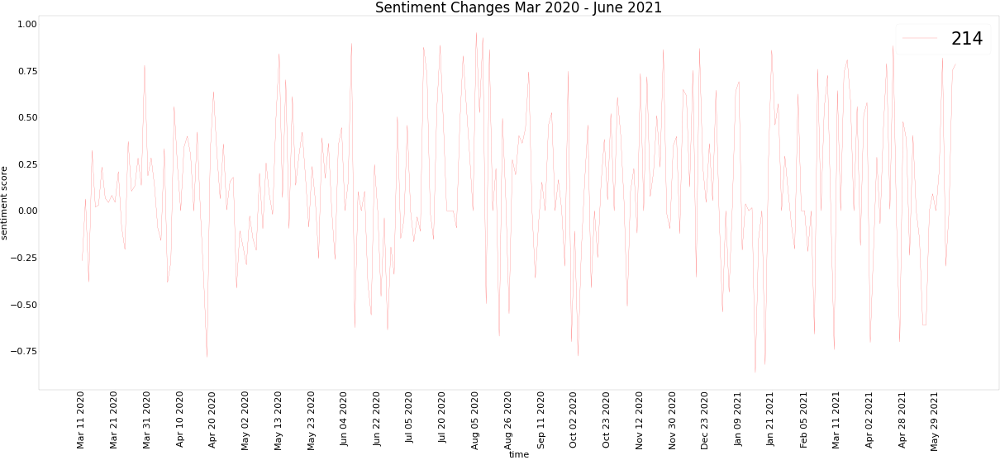

<Figure size 432x288 with 0 Axes>

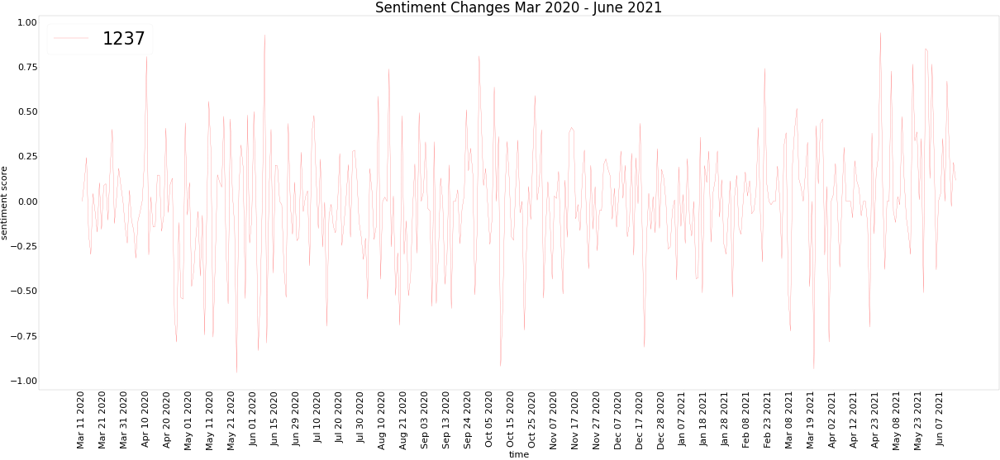

<Figure size 432x288 with 0 Axes>

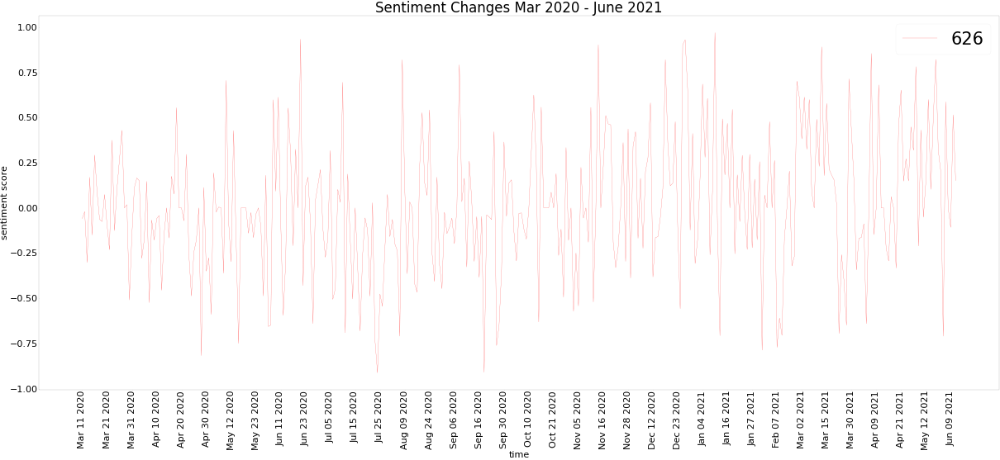

<Figure size 432x288 with 0 Axes>

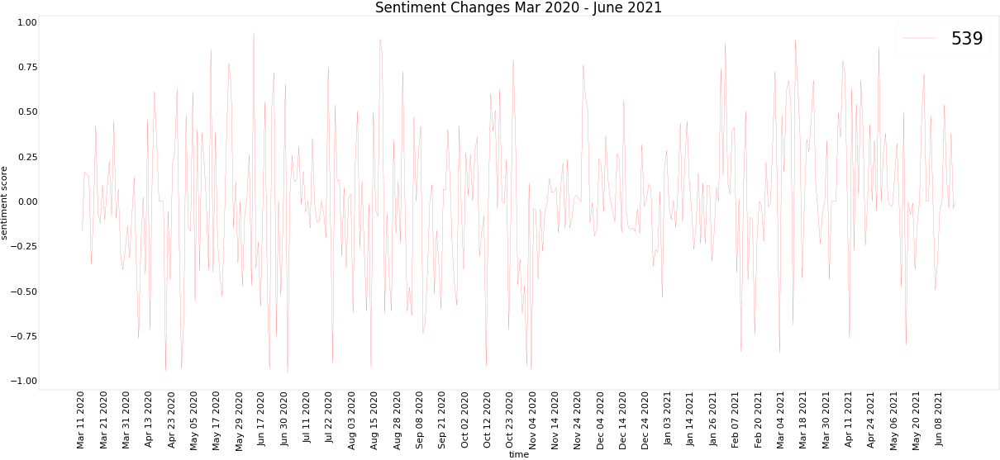

<Figure size 432x288 with 0 Axes>

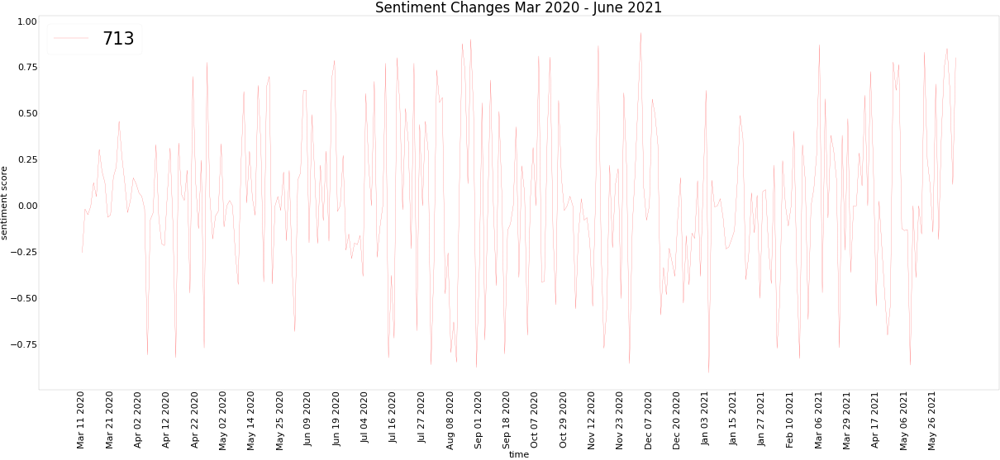

<Figure size 432x288 with 0 Axes>

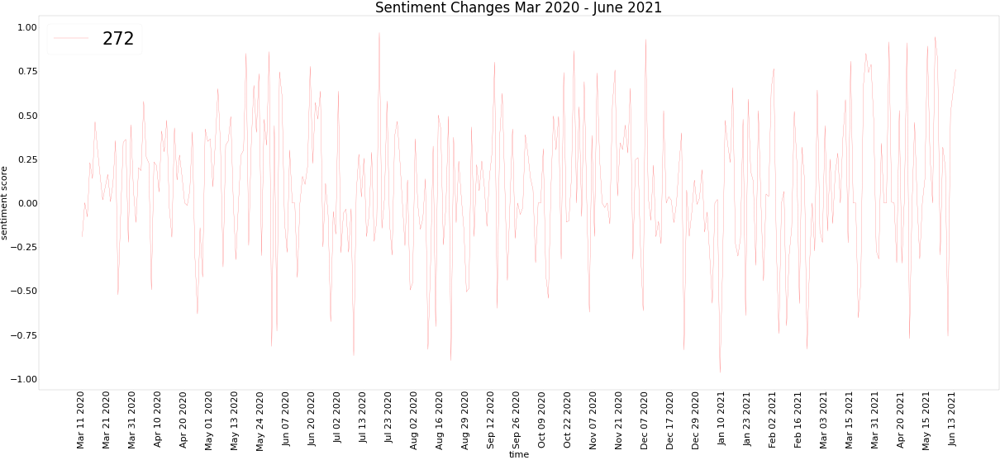

<Figure size 432x288 with 0 Axes>

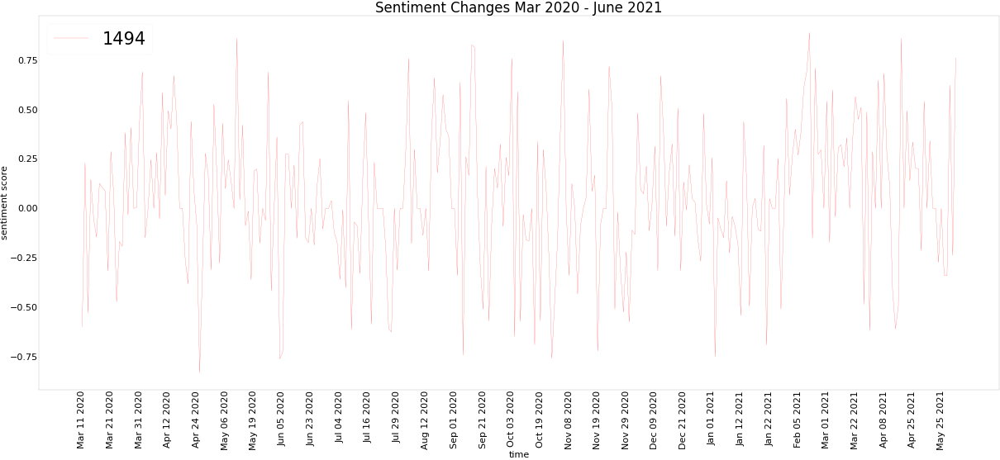

<Figure size 432x288 with 0 Axes>

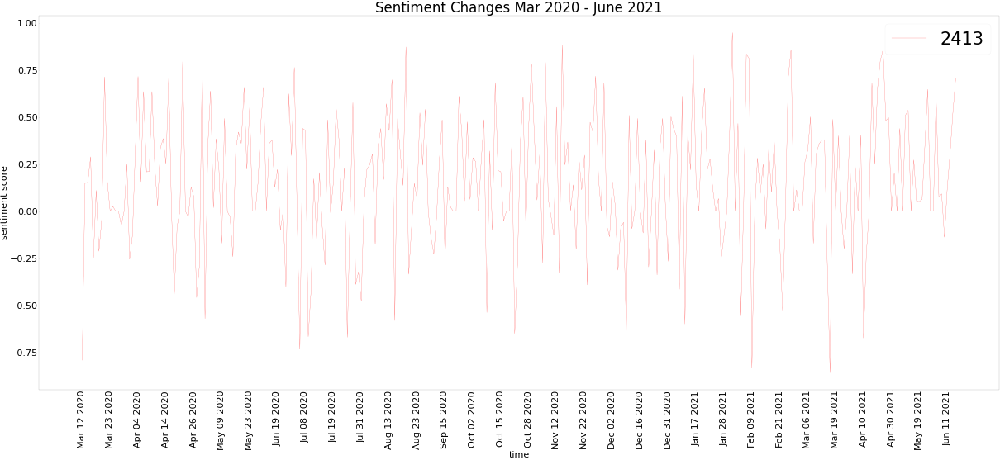

<Figure size 432x288 with 0 Axes>

In [ ]:
type(list(dict_by_community_sorted)[0])

int

# Change point detection within each community

In [ ]:
#Changepoint detection with the Pelt search method
#plot by communities
def change_point_detection_by_communities(topics: [int], sentiment_dict):

  for i in topics: 
      sorted_dates = sorted(list(sentiment_dict[i].keys()), key=lambda x: (x[-4:], MONTH_ORDER[x[0:3]]))
      sentiments = [sum(sentiment_dict[i][time]['sentiment_score'])/len(sentiment_dict[i][time]['sentiment_score']) for time in sorted_dates]
      model="rbf"
      sentiments=np.array(sentiments)
      algo = rpt.Pelt(model=model).fit(sentiments)
      result = algo.predict(pen=2) # change pen to change number of change points
      print("community", i, "Change points: ", [sorted_dates[i-1] for i in result])
      #plot volume 
      plt.figure(figsize=(120,60),dpi = 10)
      plt.title("Community {}: Volume of Tweets".format(i), fontsize = 100)
      plt.plot(sorted_dates, [len(sentiment_dict[i][time]['sentiment_score']) for time in sorted_dates],color = 'red')
      plt.xlabel('time', fontsize = 80)
      plt.ylabel('Volume',fontsize = 80)
      #plt.xticks(np.arange(0, len(sorted_dates)+1, 10))

      plt.tick_params(axis = 'x',which = 'major', labelsize = 80, rotation = 90)
      plt.tick_params(axis = 'y',which = 'major', labelsize = 80)
      #CPD
      plt.figure(figsize=(120,60),dpi = 10)
      plt.title("Community {}: Sentiment Change".format(i), fontsize = 100)
      plt.plot(sorted_dates, sentiments,color = 'red')
      plt.xlabel('time', fontsize = 80)
      plt.ylabel('Sentiment Score',fontsize = 80)
      #plt.xticks(np.arange(0, len(sorted_dates)+1, 10))

      plt.tick_params(axis = 'x',which = 'major', labelsize = 80, rotation = 90)
      plt.tick_params(axis = 'y',which = 'major', labelsize = 80)
      for r in result:
        plt.axvline(x=sorted_dates[r-1], color = 'cyan')
      #rpt.display(sentiments, result, figsize=(10, 6))
      
      #plt.title("topic "+str(i), fontsize = 200)
      plt.show()

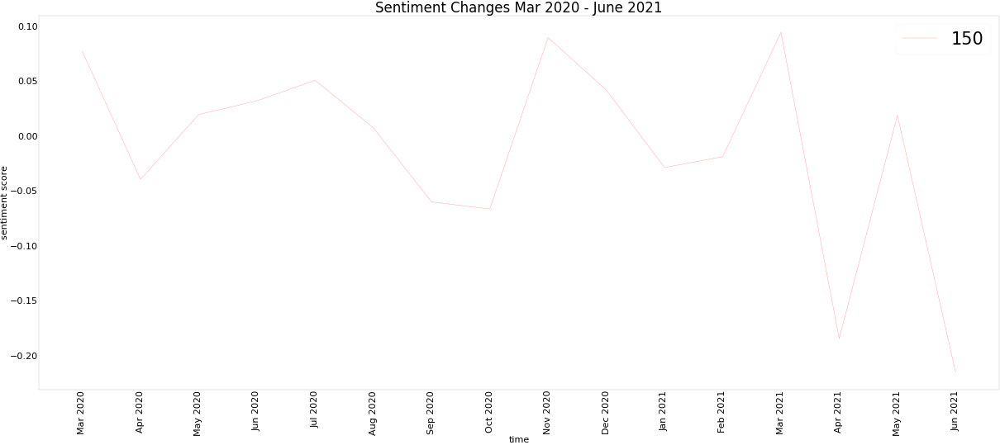

community 150 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

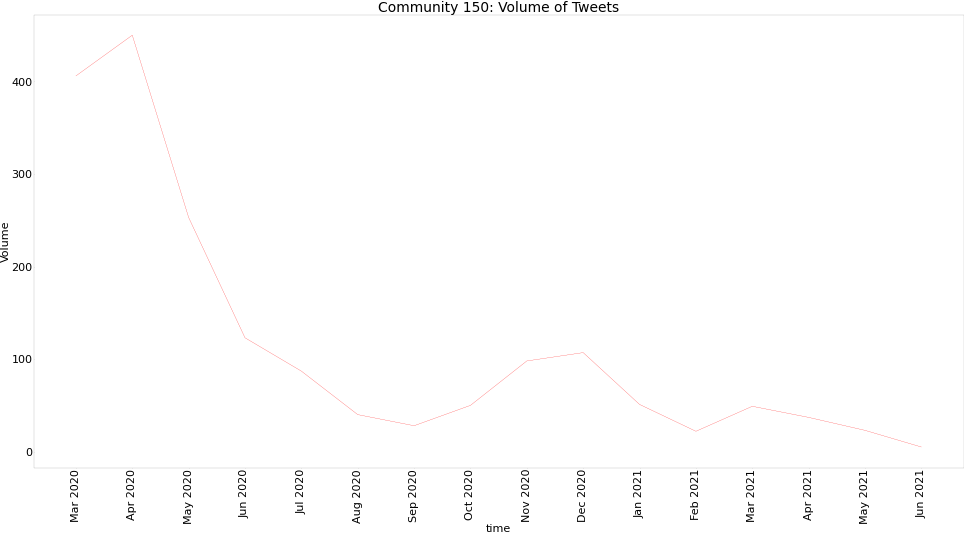

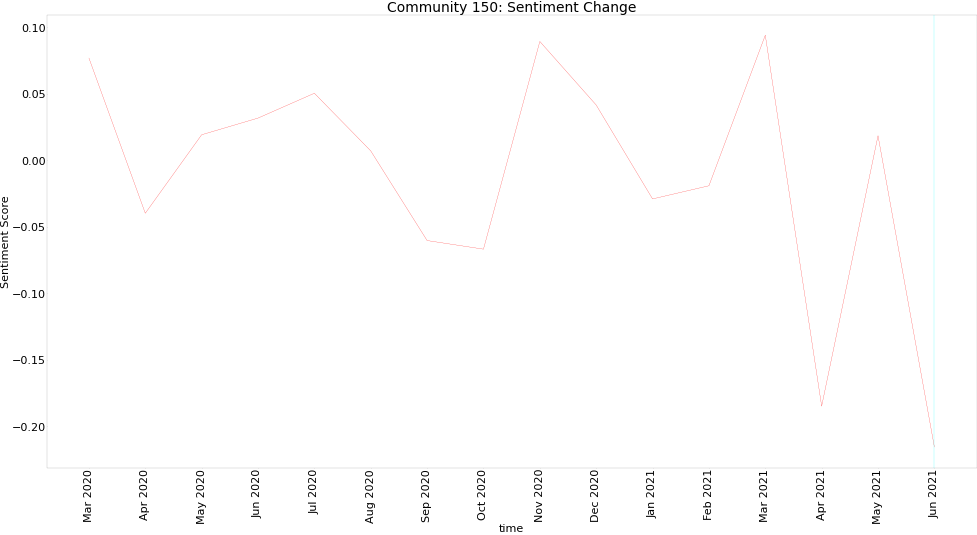

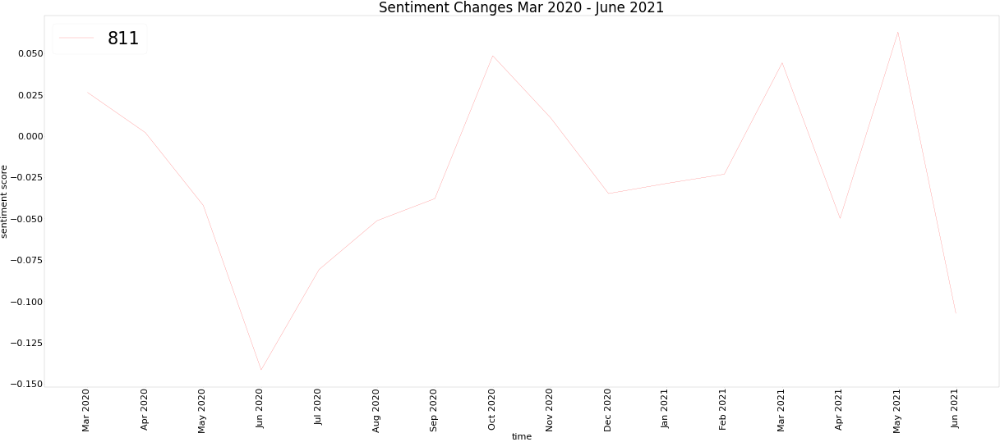

community 811 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

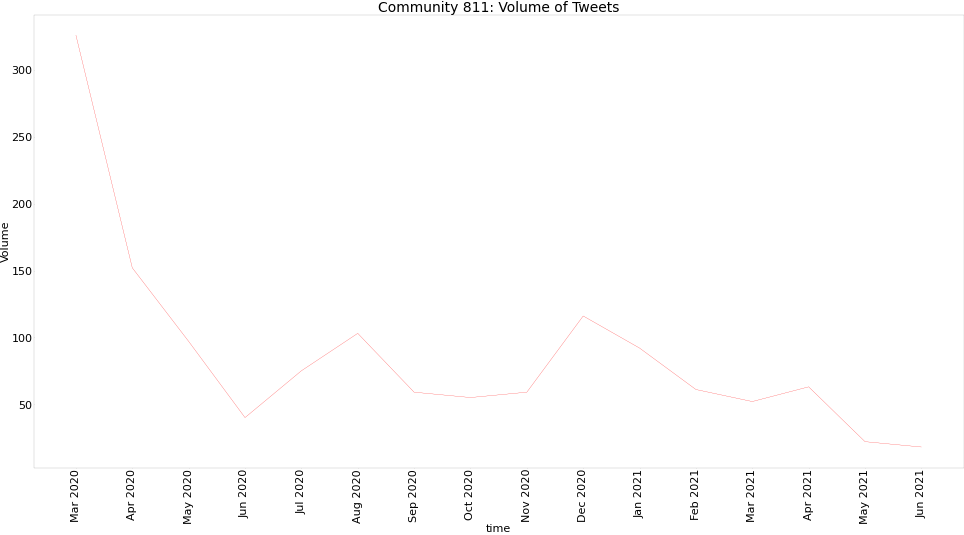

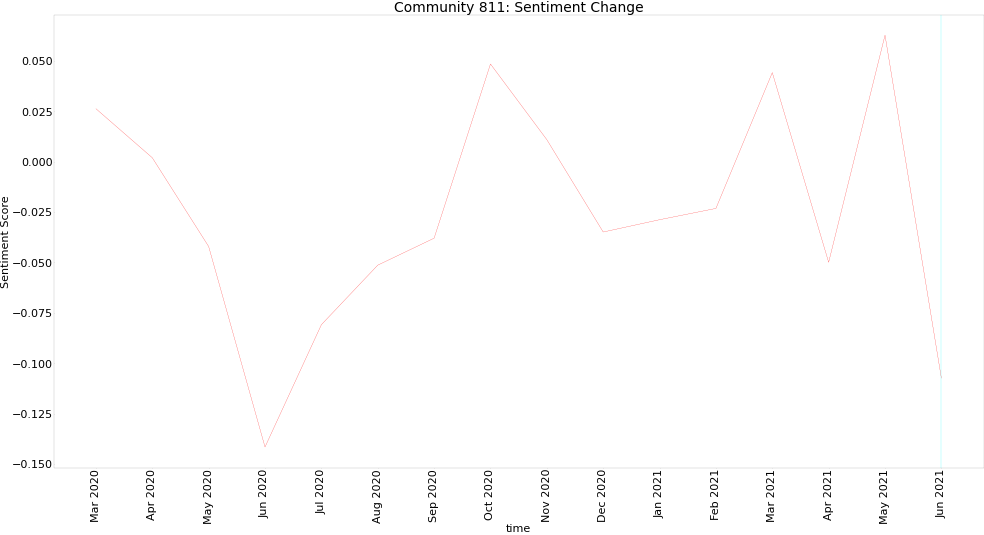

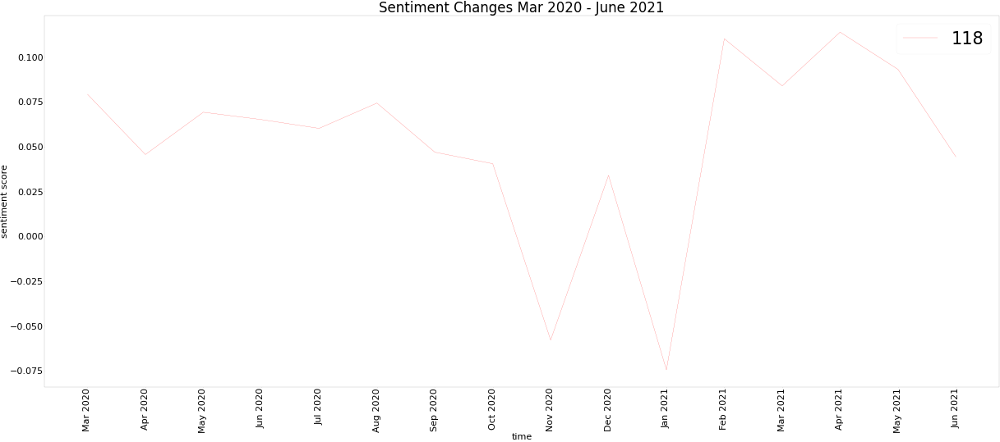

community 118 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

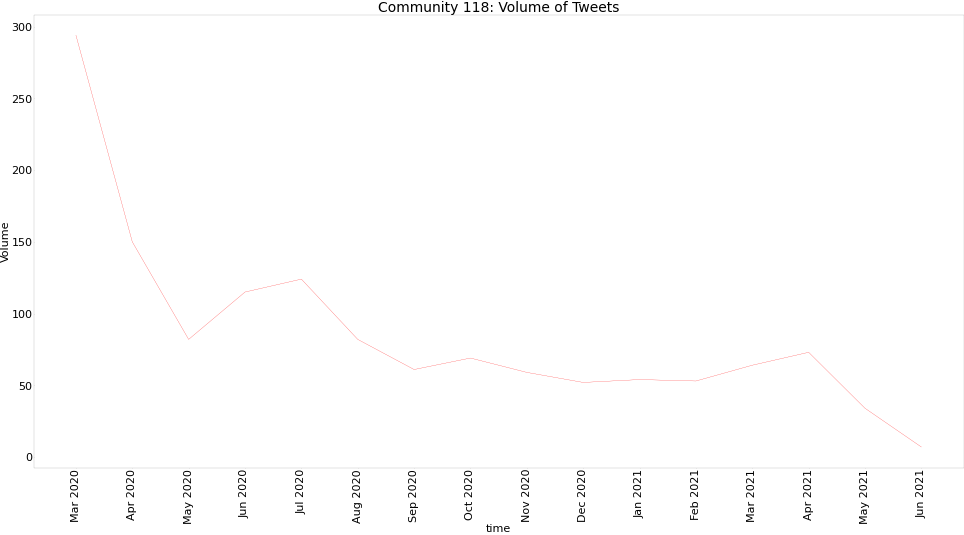

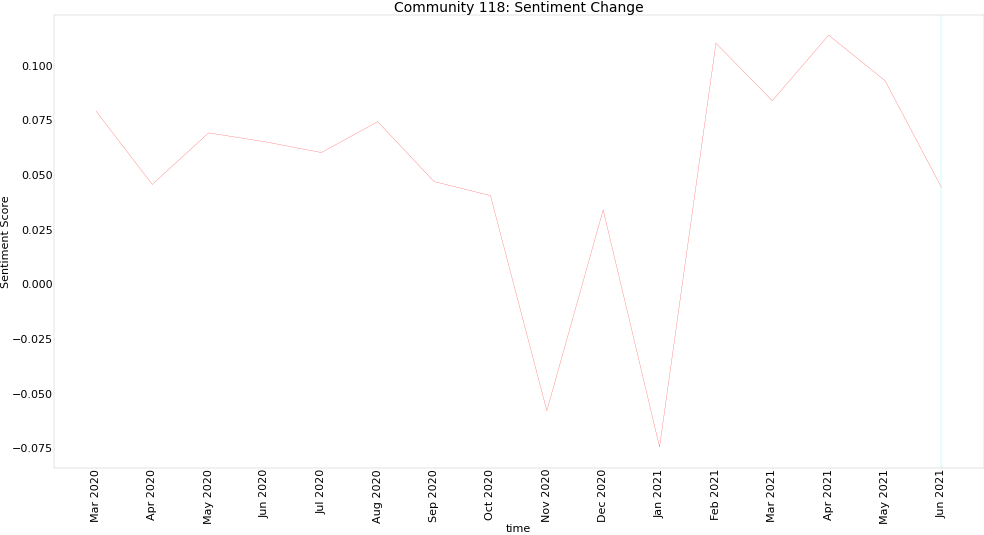

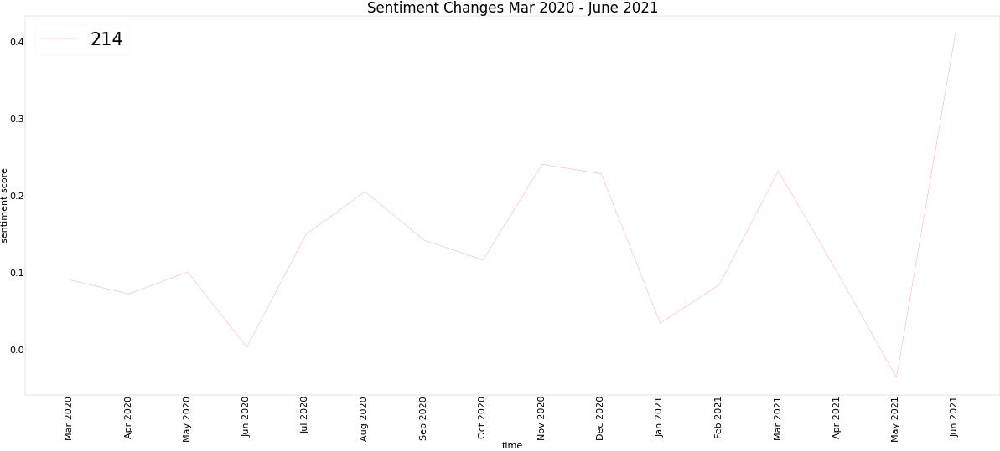

community 214 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

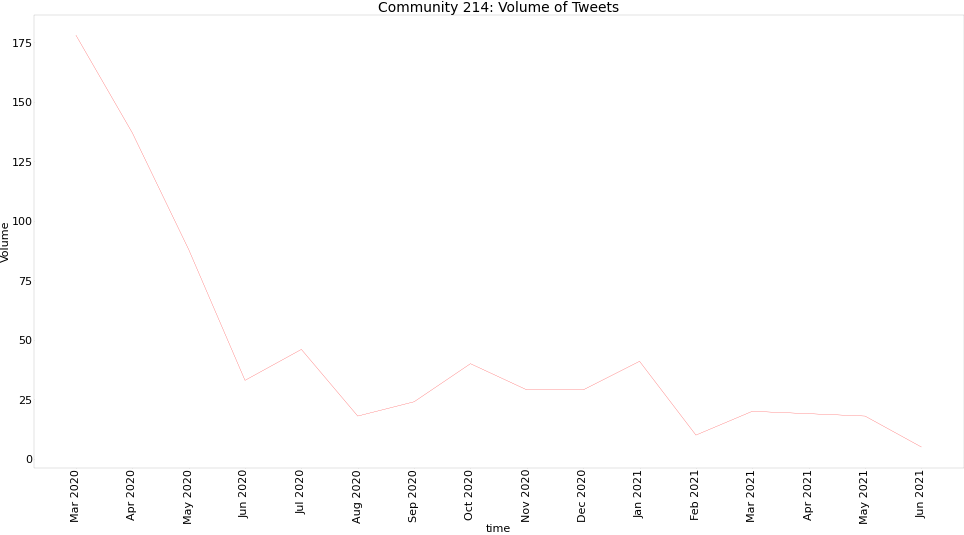

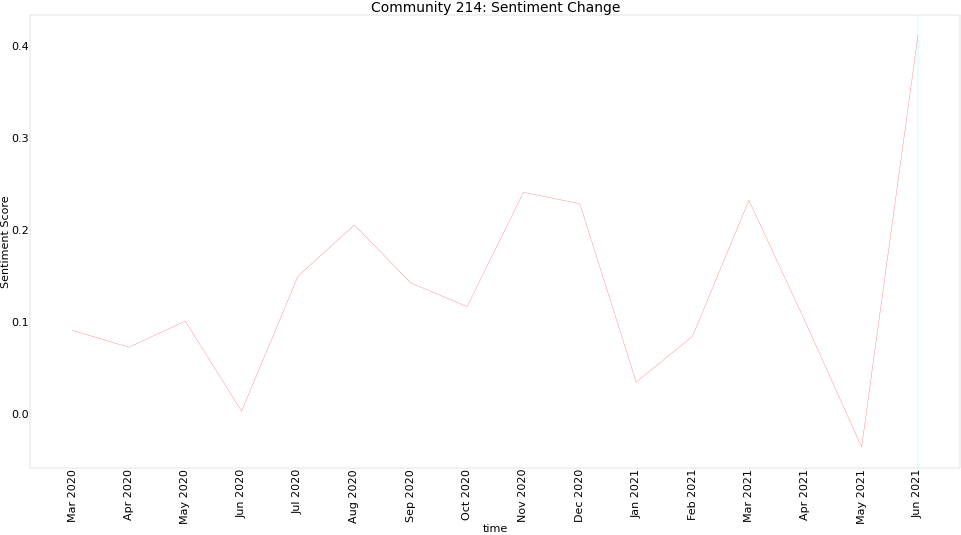

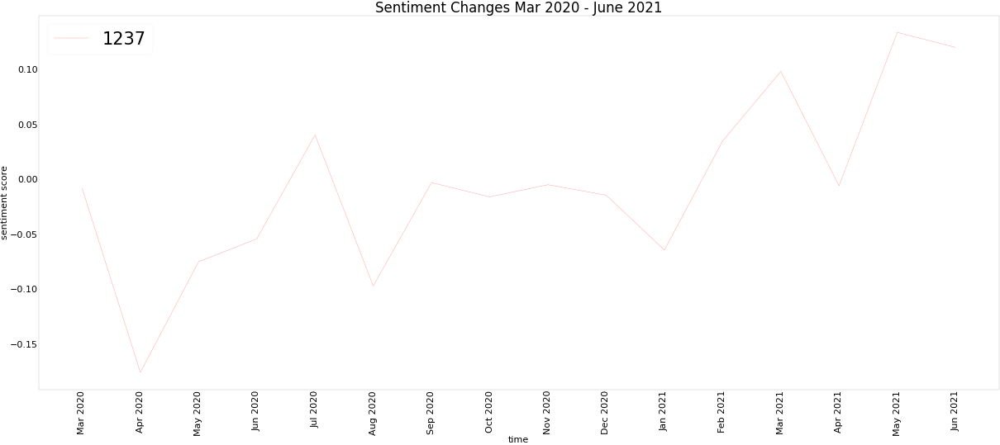

community 1237 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

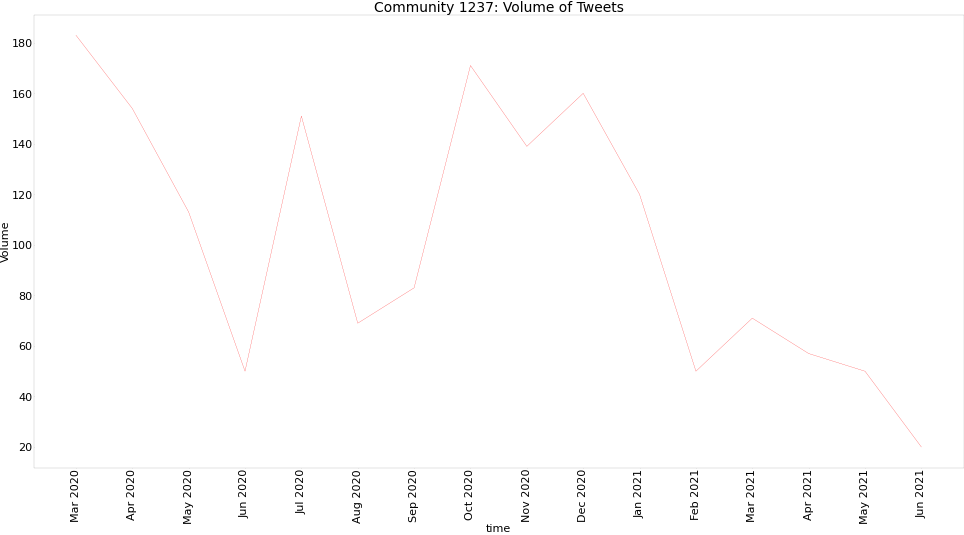

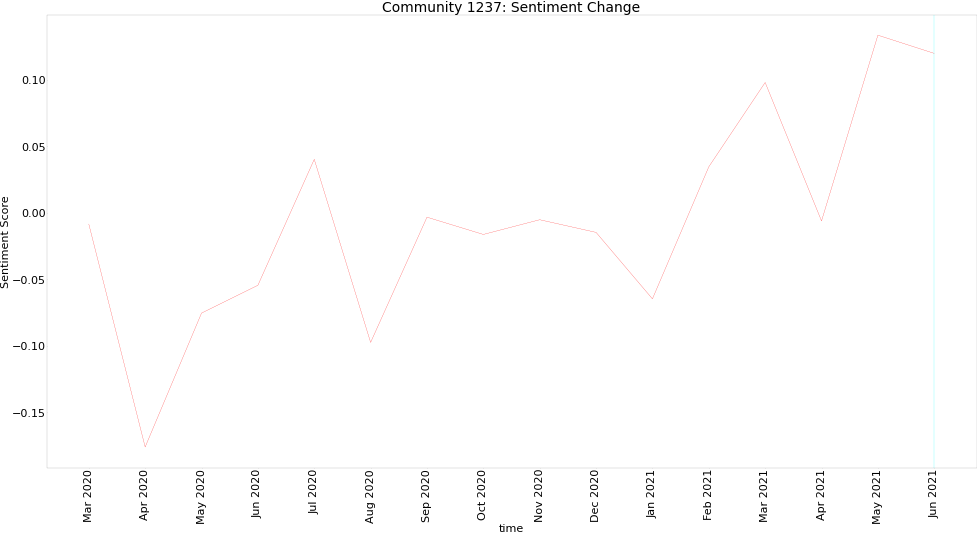

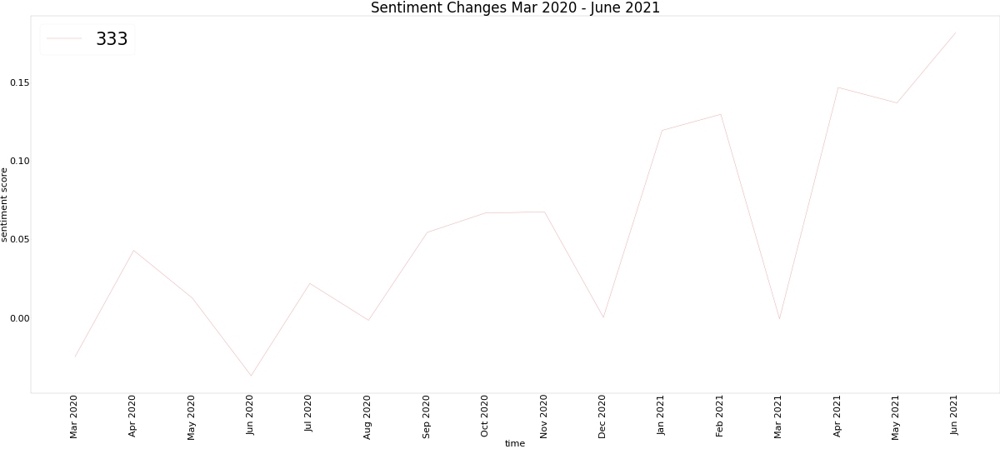

community 333 Change points:  ['Dec 2020', 'Jun 2021']


<Figure size 432x288 with 0 Axes>

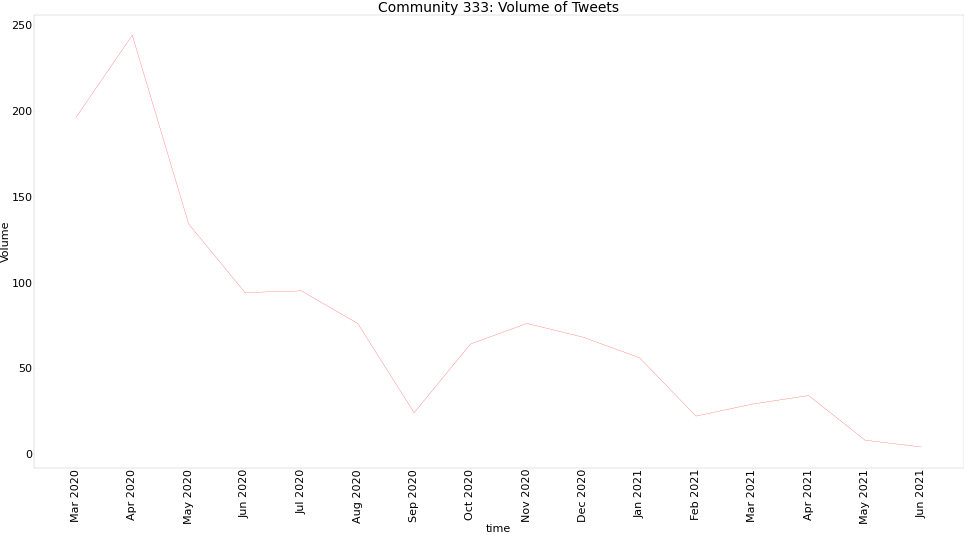

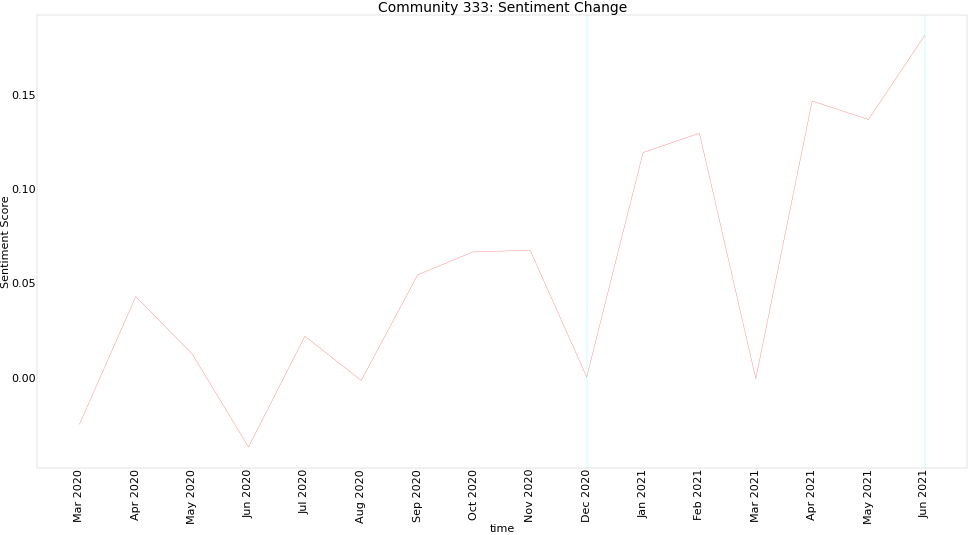

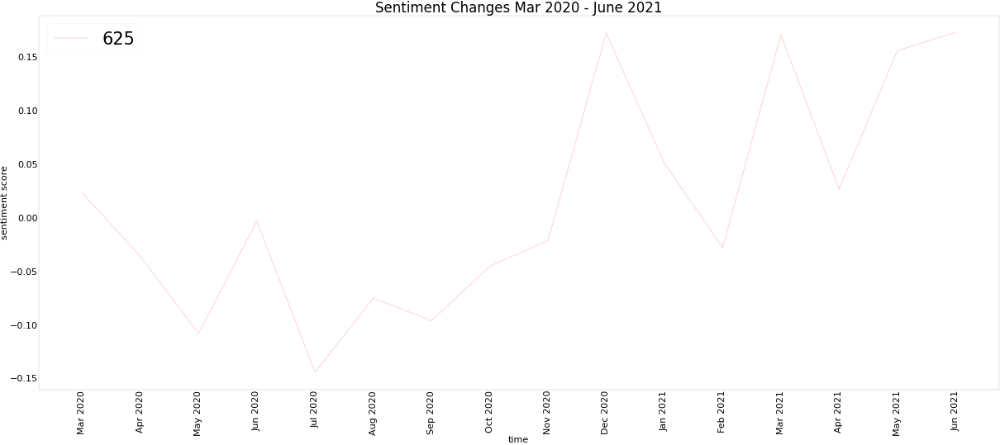

community 625 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

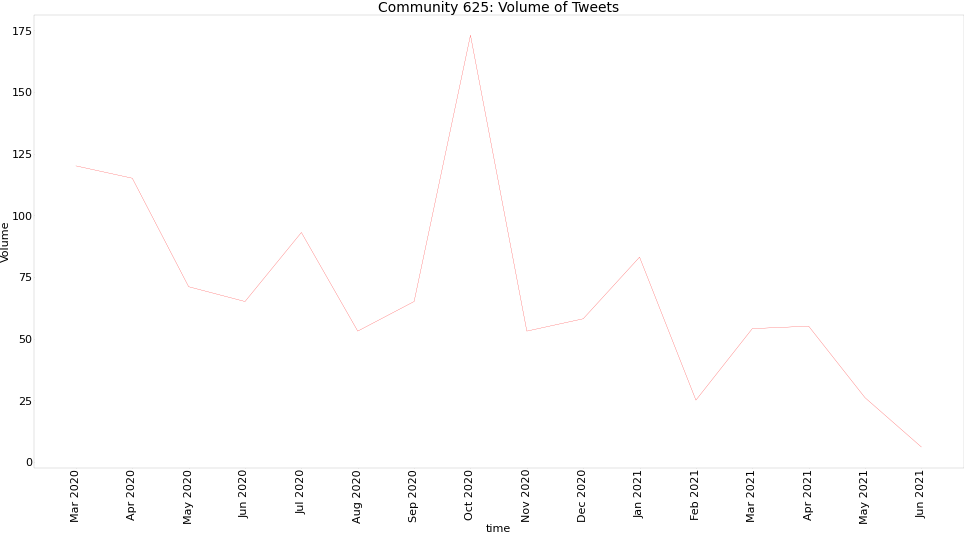

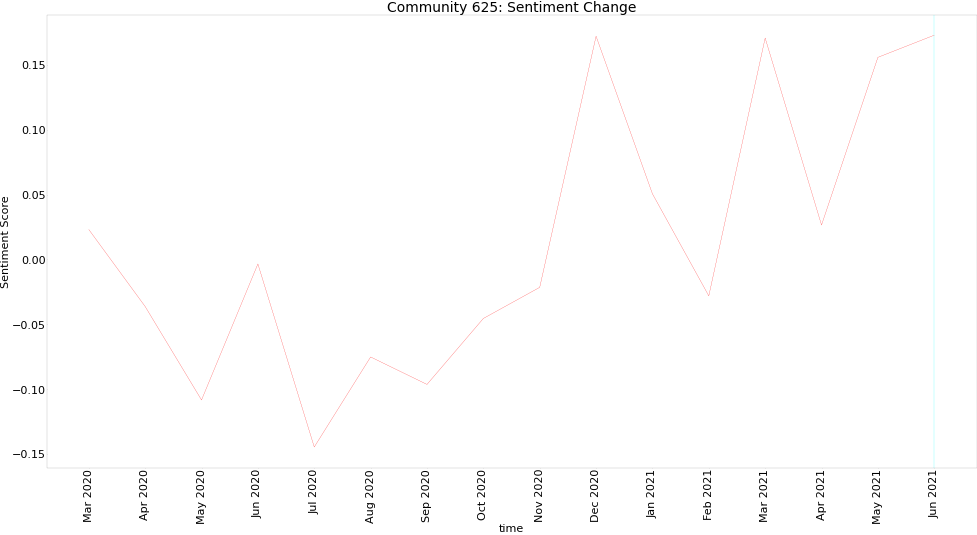

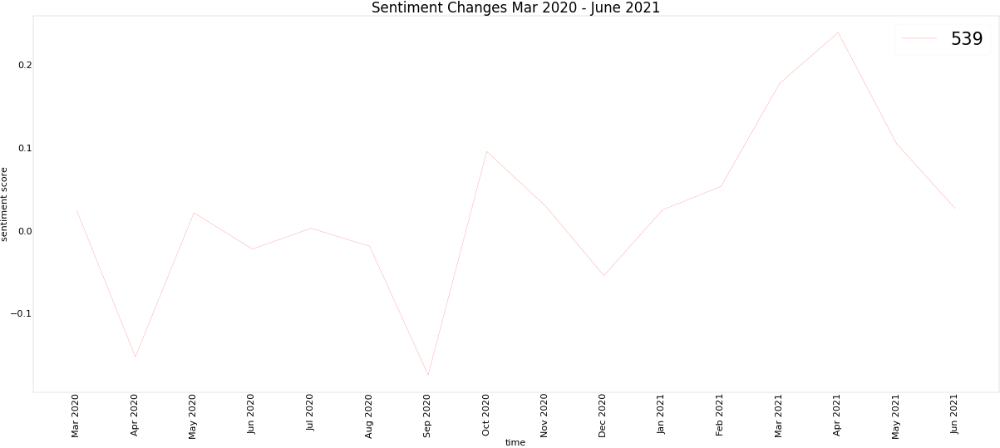

community 539 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

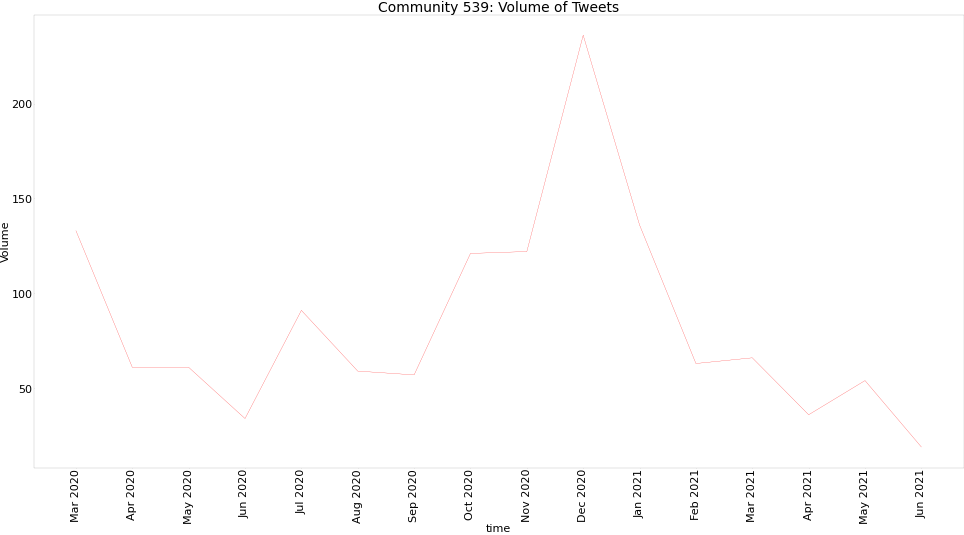

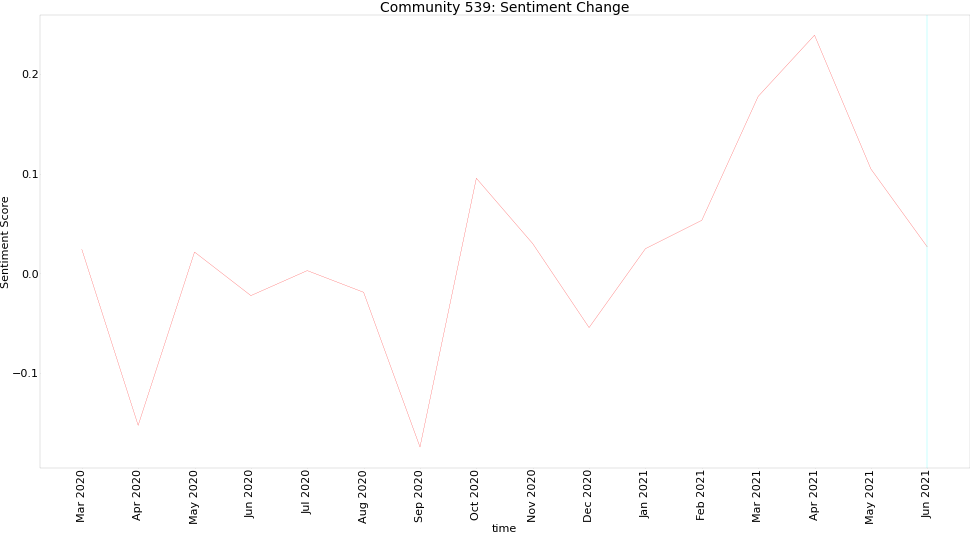

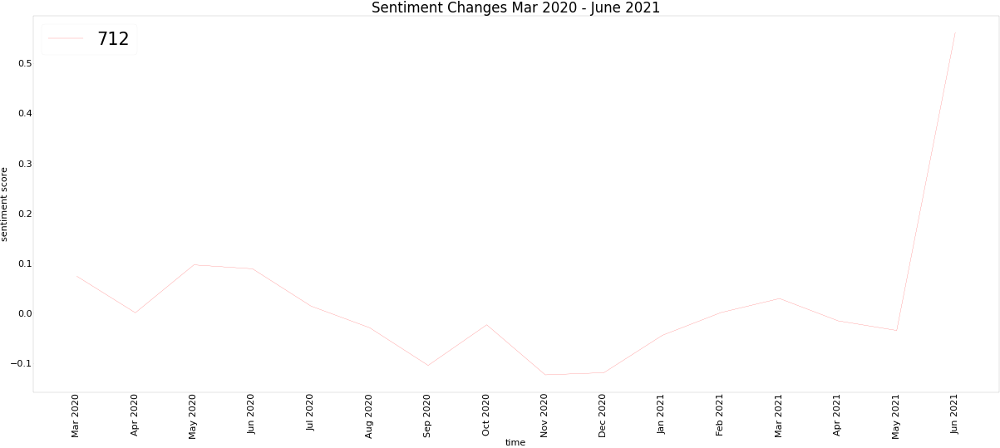

community 712 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

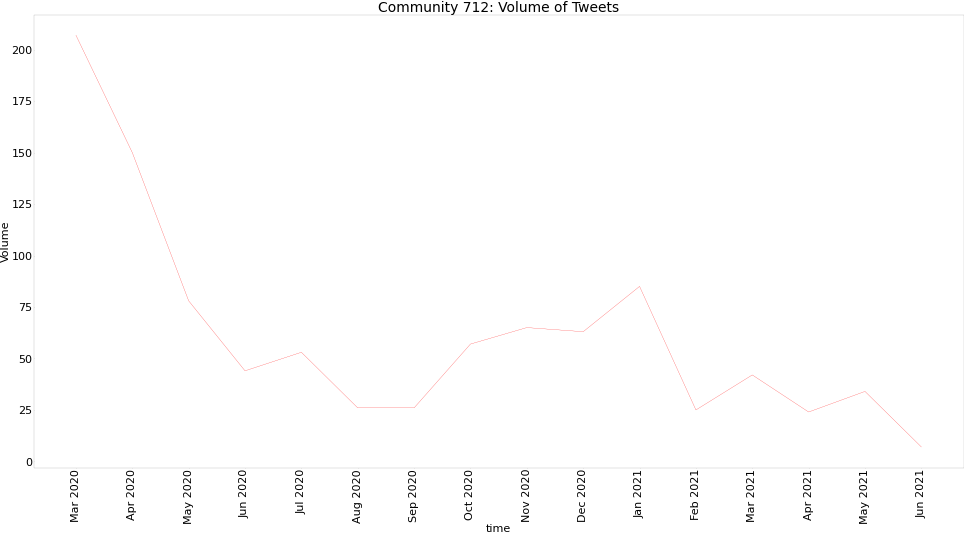

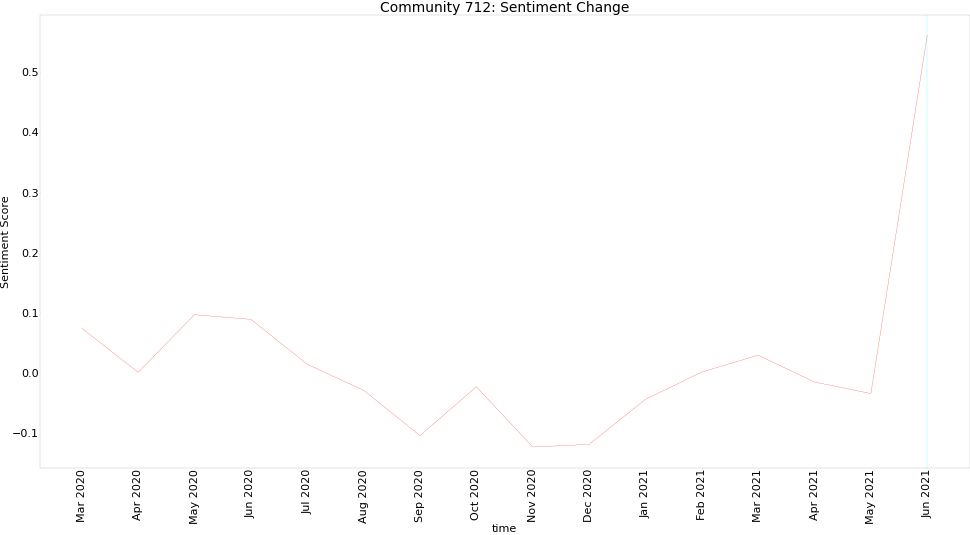

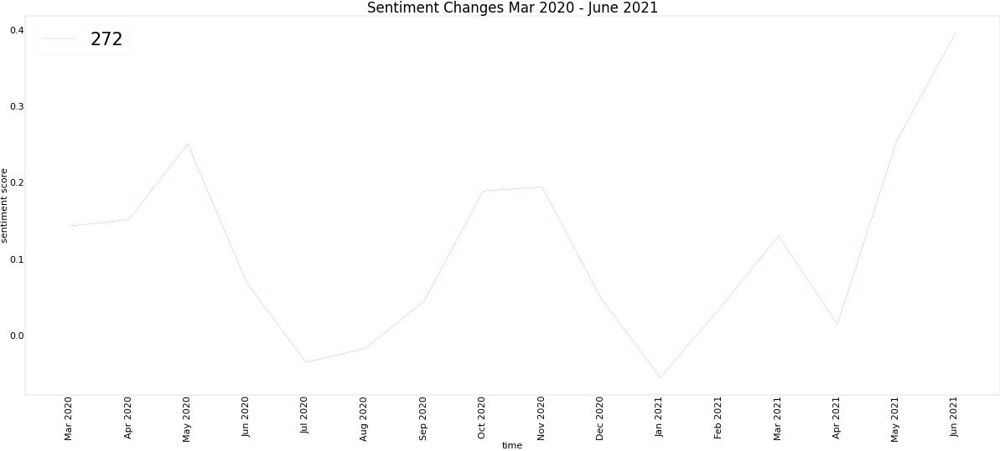

community 272 Change points:  ['Jun 2021']


<Figure size 432x288 with 0 Axes>

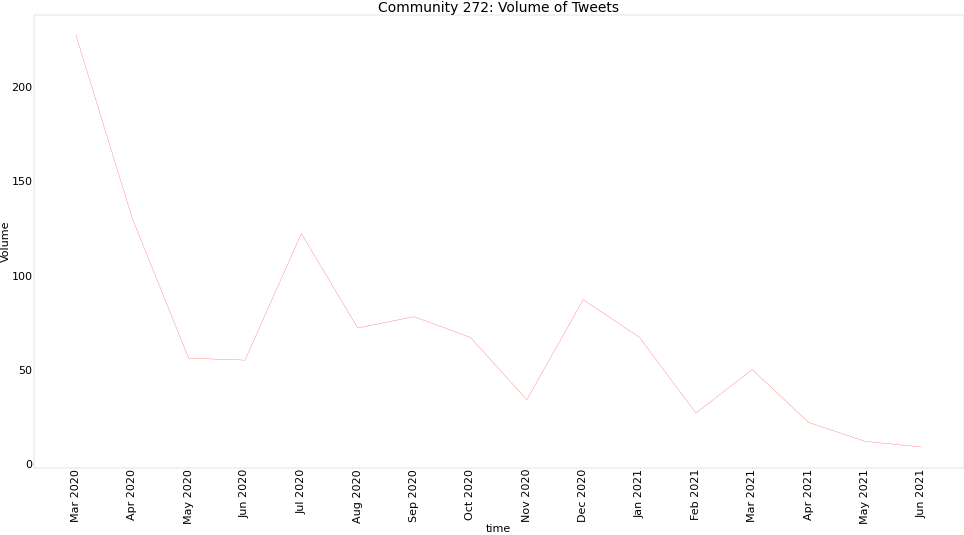

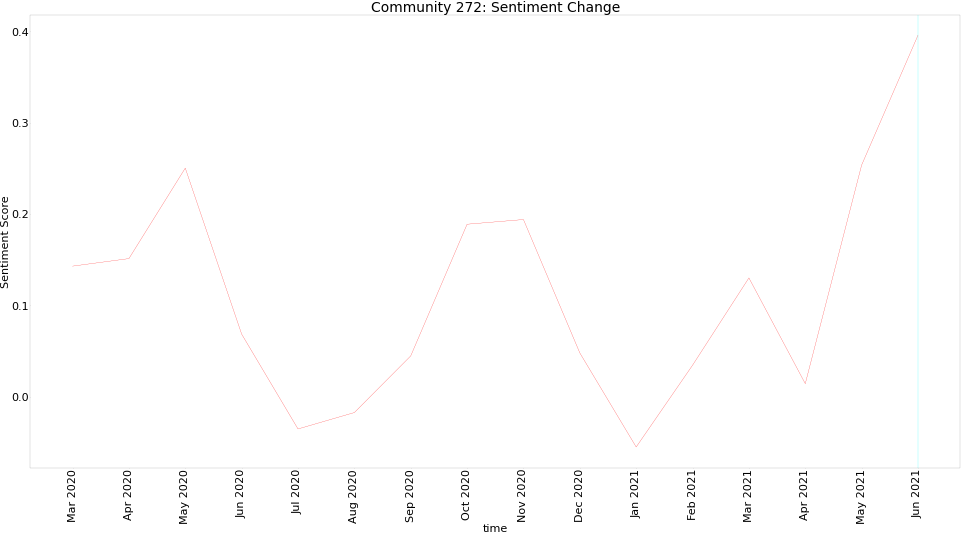

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
!pip install ruptures

import ruptures as rpt
for i in list(dict_by_community_sorted)[:10]:
  average_sentiment_score_by_communities([i,], sentiment_dicts)
  change_point_detection_by_communities([i,], sentiment_dicts)

In [ ]:
for i in dict_by_community_sorted[:15]:
  print(i)
  print("number of tweets:", number_of_tweets(i, G, partition, partition_dict_by_community))
  print("number of users:" ,number_of_users(i, G, partition, partition_dict_by_community))
  print("most common keywords:", print_most_common_keywords(find_common_keyword(i, G,partition,partition_dict_by_community), 20))
  #plot_one_community(i, partition,partition_dict_by_community, G)